<center><image src="https://drive.google.com/uc?id=1n3G4TdK_u6PQHcLrxB_A0HijNdigXmUH">

<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков. Домашнее задание можно разделить на следующие части:

* Построй свой первый бейзлайн! [6]
  * BCE Loss [2]
  * SegNet [2]
  * Train [1]
  * Test [1]
* Мир других лоссов! [2]
  * Dice Loss [1]
  * Focal Loss [1]
  * BONUS: лосс из статьи [5]
* Новая модель! [2]
  * UNet [2]


**Максимальный балл:** 10 баллов.

Также для студентов желающих еще более углубиться в задачу предлагается решить бонусное задание, которое даст дополнительные 5 баллов. BONUS задание необязательное.


# Шаг 1. Загрузка и подготовка данных

1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>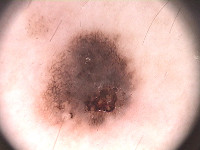</td><td>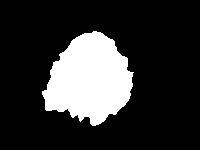</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

In [1]:
!gdown 1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql

Downloading...
From (original): https://drive.google.com/uc?id=1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql
From (redirected): https://drive.google.com/uc?id=1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql&confirm=t&uuid=c72f313e-c423-43e3-841f-f45c7690437e
To: /content/PH2Dataset.rar
100% 162M/162M [00:02<00:00, 78.9MB/s]


In [2]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [3]:
images = []
lesions = []
from skimage.io import imread
import os
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [4]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [5]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

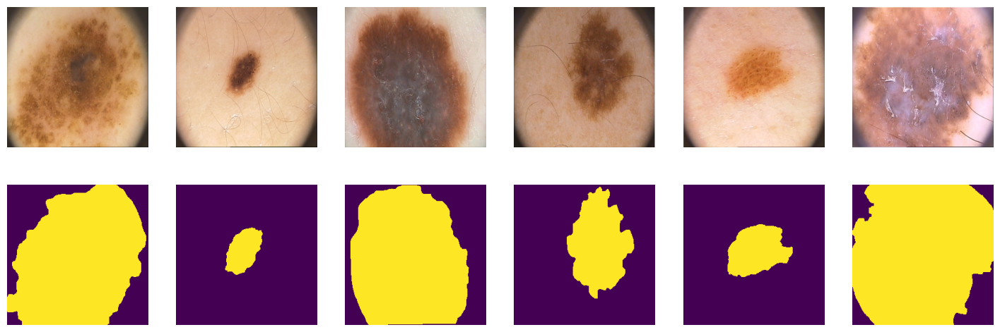

In [6]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста соответственно

In [7]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [8]:
print(len(tr), len(val), len(ts))

100 50 50


## PyTorch DataLoader

In [9]:
from torch.utils.data import DataLoader
batch_size = 25
train_dataloader = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=False)

In [10]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Шаг 2. Метрика качества модели

## IoU (intersection over union)

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Что будет являться пересением и объединением в задаче сегментации?

Давайте разберем следующий пример:





<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1rBYFgli48AUUN9idiyq8j3J5DboB93yN" width=1000 height=800/></p>

In [11]:
!pip install torchmetrics==0.11.4

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 16.2 MB/s eta 0:00:00


In [12]:
from torchmetrics import JaccardIndex

iou_score = JaccardIndex(threshold=0.5, task="binary", average='none').to(device)

# Задания: Построй свой первый бейзлайн!

Итак, загрузка файлов, код датасета и даталоадера написана за вас. Метрика IoU написана за вас! Вам остается написать лосс, модель и функции обучения и теста модели.

* Построй свой первый бейзлайн! [6]
  * BCE Loss [2]
  * SegNet [2]
  * Train [1]
  * Test [1]

## Шаг 3. Loss функция - BCE [2 балла]

Популярным лоссом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$

### Вывод численно стабильной формулы BCE лосса [1 балл]



Выведите из формулы [1] формулу [2]:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$

Не забываем, что здесь $\hat y_i$ - это логиты сети, не вероятности и не лейблы.

**Ответ:**
$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$


Так как $\sigma(\hat y_i) = \frac {1} {1 + \exp(-\hat y_i)}$, то $ \log \sigma(\hat y_i) = \log (\frac {1} {1 + \exp(-\hat y_i)}) = -\log (1 + \exp(-\hat y_i))$

$1 - \sigma(\hat y_i) = 1 - \frac {1} {1 + \exp(-\hat y_i)} = \frac {\exp(-\hat y_i)} {1 + \exp(-\hat y_i)}$, тогда $\log (\frac {\exp(-\hat y_i)} {1 + \exp(-\hat y_i)}) = \log ({\exp(-\hat y_i)}) - \log ({1 + \exp(-\hat y_i)}) = -\hat y_i - \log ({1 + \exp(-\hat y_i)}) $

Подставим полученные выражения в $[1]$:
$$ \mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i(-\log (1 + \exp(-\hat y_i))) + (1-y_i)(-\hat y_i - \log ({1 + \exp(-\hat y_i)}))\right] $$

Вынесем минус за скобки знак суммы:
$$ \mathcal L_{BCE}(y, \hat y) = \sum_i \left[y_i\log (1 + \exp(-\hat y_i)) + (1-y_i)(\hat y_i + \log ({1 + \exp(-\hat y_i)}))\right] $$

Раскроем скобки:
$$ \mathcal L_{BCE}(y, \hat y) = \sum_i \left[y_i\log (1 + \exp(-\hat y_i)) + \hat y_i + \log ({1 + \exp(-\hat y_i)}) - y_i\hat y_i - y_i\log ({1 + \exp(-\hat y_i)})\right] $$
$$ \mathcal L_{BCE}(y, \hat y) = \sum_i \left[\hat y_i + \log ({1 + \exp(-\hat y_i)}) - y_i\hat y_i\right] $$

Так как $1 - y_i = 1 - y$ и $y_i = y$, получаем:
$$\mathcal L_{BCE} = \hat y + \log\left(1+\exp(-\hat y)\right) - y\hat y \space
 = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right)$$


### Реализуйте в коде оба варианта лосса [1 балл]

Реализуйте следующие функции:

*   `bce_true()` - честная прямая реализация лосса с формулой $$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$
*   `bce_loss()` - реализация формулы, которую мы вывели $$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

И сравните результаты функций с реализацией Pytorch:
*   `bce_torch()`
*   `bce_torch_with_logits()`

In [13]:
import torch.nn.functional as F
import torch.nn as nn

In [14]:
bce_torch = nn.BCELoss(reduction='sum') # (sigmoid(y_pred), y_real)
bce_torch_with_logits = nn.BCEWithLogitsLoss(reduction='sum')

In [15]:
def bce_loss(y_pred, y_real):
    return torch.sum(y_pred - y_real * y_pred + torch.log(1 + torch.exp(-y_pred)))

def bce_true(y_pred, y_real):
    s = 0
    for y_pred_val, y_real_val in zip(y_pred, y_real):
        sigm = torch.sigmoid(y_pred_val)
        s -= y_real_val * torch.log(sigm) + (1 - y_real_val) * torch.log(1 - sigm)
    return s.sum()

Проверим корректность работы на простом примере

In [16]:
y_pred = torch.randn(3, 2, requires_grad=False)
y_true = torch.rand(3, 2, requires_grad=False)

print(f'BCE loss from scratch bce_loss             = {bce_loss(y_pred, y_true)}')
print(f'BCE loss честно посчитанный                = {bce_true(y_pred, y_true)}')
print(f'BCE loss from torch bce_torch              = {bce_torch(torch.sigmoid(y_pred), y_true)}')
print(f'BCE loss from torch with logits bce_torch  = {bce_torch_with_logits(y_pred, y_true)}')


BCE loss from scratch bce_loss             = 5.333466529846191
BCE loss честно посчитанный                = 5.333466529846191
BCE loss from torch bce_torch              = 5.333466529846191
BCE loss from torch with logits bce_torch  = 5.333466529846191


Инструкции `assert` в Python — это булевы выражения, которые проверяют, является ли условие истинным (`True`). Внизу в коде мы проверяем функция `bce_loss()` выдает тот же результат, что и функция из Pytorch или нет. Если равенства не будет, что будет означать, что результаты функций не совпадают, а значит вы неправильно реализовали фукнцию `bce_loss()`, `assert` возвратит ошибку.

Функция `numpy.isclose()` используется для сравнения двух чисел с учётом допустимой погрешности. Она особенно полезна при работе с числами с плавающей точкой, где точное сравнение может быть проблематичным из-за ограничений представления таких чисел в компьютере.

Как она работает?

`numpy.isclose(a, b, rtol=1e-05, atol=1e-08) `принимает два числа (`a` и `b`) и сравнивает их, учитывая относительную и абсолютную погрешность. Если разница между двумя числами меньше заданного порога, функция возвращает `True`, иначе — `False`.

Параметры:

    rtol: Относительная погрешность (по умолчанию 1e-05). Используется для определения разницы относительно большего значения.
    atol: Абсолютная погрешность (по умолчанию 1e-08). Определяет минимальную разницу, которую следует учитывать.

Мы будем использовать `assert` и `numpy.isclose()` для проверки корректности нашего кода.

In [17]:
assert np.isclose(bce_loss(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true))
assert np.isclose(bce_loss(y_pred, y_true), bce_torch_with_logits(y_pred, y_true))
assert np.isclose(bce_true(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true))
assert np.isclose(bce_true(y_pred, y_true), bce_torch_with_logits(y_pred, y_true))

Давайте теперь посчитаем на простом примере, но с теми же размерностями, что и в датасете

In [18]:
y_pred = torch.randn((2, 1, 3, 3), requires_grad=False)
y_true = torch.randint(0, 2, (2, 1, 3, 3))

print(f'BCE loss from scratch bce_loss            = {bce_loss(y_pred, y_true)}')
print(f'BCE loss честно посчитанный               = {bce_true(y_pred, y_true)}')
print(f'BCE loss from torch bce_torch             = {bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float))}')
print(f'BCE loss from torch with logits bce_torch = {bce_torch_with_logits(y_pred, y_true.to(torch.float))}')

BCE loss from scratch bce_loss            = 13.724225997924805
BCE loss честно посчитанный               = 13.724225997924805
BCE loss from torch bce_torch             = 13.724225044250488
BCE loss from torch with logits bce_torch = 13.724225997924805


In [19]:
assert np.isclose(bce_loss(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float)))
assert np.isclose(bce_loss(y_pred, y_true), bce_torch_with_logits(y_pred, y_true.to(torch.float)))
assert np.isclose(bce_true(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float)))
assert np.isclose(bce_true(y_pred, y_true), bce_torch_with_logits(y_pred, y_true.to(torch.float)))

Давайте посчитаем на реальных логитах и сегментационной маске:

In [20]:
!gdown --folder 1EX0RW1TRQVkLmR1h6miCQqyhYPFyg28M

Retrieving folder contents
Processing file 1--WxvBdpMn_NOmYPf3a4au8MHzfx5baC labels.pt
Processing file 1-0A7_CS_vKiSCkgIDJ4joThCEcFedA3I logits.pt
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1--WxvBdpMn_NOmYPf3a4au8MHzfx5baC
To: /content/for_asserts/labels.pt
100% 1.18k/1.18k [00:00<00:00, 519kB/s]
Downloading...
From: https://drive.google.com/uc?id=1-0A7_CS_vKiSCkgIDJ4joThCEcFedA3I
To: /content/for_asserts/logits.pt
100% 1.18k/1.18k [00:00<00:00, 5.32MB/s]
Download completed


In [21]:
path_to_dummy_samples = '/content/for_asserts'
dummpy_sample = {'logits': torch.load(f'{path_to_dummy_samples}/logits.pt'),
                 'labels': torch.load(f'{path_to_dummy_samples}/labels.pt')}
dummpy_sample['labels'] = dummpy_sample['labels'].to(device)
dummpy_sample['logits'] = dummpy_sample['logits'].to(device)

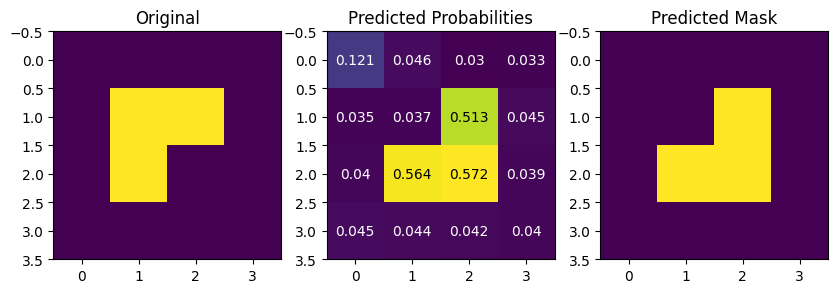

In [22]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize= (10,3*10))

ax1.imshow(dummpy_sample['labels'].squeeze(1)[0].cpu())
ax1.set_title("Original")

ax2.imshow(dummpy_sample['logits'].sigmoid().squeeze(1)[0].cpu())
for (j,i),label in np.ndenumerate(dummpy_sample['logits'].sigmoid().squeeze(1)[0].cpu()):
    if label < 0.5:
        color = 'white'
    else:
        color = 'black'
    ax2.text(i,j,round(label,3), color=color, ha='center',va='center')

ax2.set_title("Predicted Probabilities")

ax3.imshow((dummpy_sample['logits'].sigmoid() > 0.5).squeeze(1)[0].cpu())
ax3.set_title("Predicted Mask")
plt.show()

Проверяем на данном примере:

In [23]:
bce_loss_score = bce_loss(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu())
bce_true_score = bce_true(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu())
bce_torch_score = bce_torch(torch.sigmoid(dummpy_sample['logits'].cpu()), dummpy_sample['labels'].cpu().float())
bce_torch_with_logits_score = bce_torch_with_logits(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu().float())
assert np.isclose(bce_loss_score, bce_torch_score)
assert np.isclose(bce_loss_score, bce_torch_with_logits_score)
assert np.isclose(bce_true_score, bce_torch_score)
assert np.isclose(bce_true_score, bce_torch_with_logits_score)

## Шаг 4. Модель SegNet [2 балла]

Ваше задание здесь состоит в том, чтобы реализовать SegNet архитектуру.

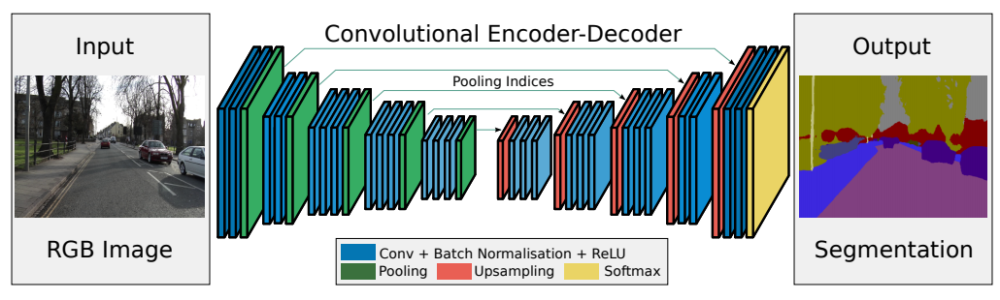

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

In [24]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

import warnings
warnings.filterwarnings("ignore")

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки. Для этого скачаем и изучим feature extractor VGG-16, который лежит в основе SegNet.

In [ ]:
model_vgg16 = models.vgg16(weights = models.VGG16_Weights.IMAGENET1K_V1)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:06<00:00, 88.7MB/s]


In [ ]:
model_vgg16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Feature extractor VGG-16 состоит из 5 блоков:
- два блока со структурой:
Conv2d -> ReLU -> Conv2d -> ReLU -> MaxPool2d
- три блока со структурой:
Conv2d -> ReLU -> Conv2d -> ReLU -> Conv2d -> ReLU -> MaxPool2d

В первом блоке - на входе три канала (по числу каналов в изображениях), которые конволюционный слой преобразует в 64 канала.

Во втором, третьем и четвертом блоках первый конволюционный слой удваивает количество каналов, а последующие конволюционные слои не меняют количество каналов.

В последнем блоке число каналов от слоя к слою не меняется.

Теперь напишем код одного блока энкодера нашей модели SegNet.  

In [ ]:
# Параметрами блока будут:
# - количество каналов на входе
# - количество каналов на выходе
# - глубина блока (2 или 3, по количеству конволюционных слоев)
# - kernel_size и padding
#
class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, depth, kernel_size=3, padding=1):
        super(EncoderBlock, self).__init__() # инициируем экземляр класса, наследующего от nn.Module
        self.layers = nn.ModuleList() # в self.layers будем добавлять слои блока
        # дальше реализуем то, что на картинке выше обозначено Conv + Batch Normalization + ReLU
        self.layers.append(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, padding=padding))
        self.layers.append(nn.BatchNorm2d(out_channels))
        self.layers.append(nn.ReLU(inplace=True))

        # цикл for помогает использовать один код для блоков как с глубиной 2, так и с глубиной 3
        for i in range(depth-1):
            self.layers.append(nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=kernel_size, padding=padding))
            self.layers.append(nn.BatchNorm2d(out_channels))
            self.layers.append(nn.ReLU(inplace=True))

        self.maxpooling = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True) #добавляем MaxPool с индексами для последующего Unpooling

    # Обратите внимание: на вход метод forward() получает карту признаков (х),
    # а возвращает карту признаков и индексы для последующего Unpooling
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        x, indices = self.maxpooling(x)
        return x, indices


По аналогии напишите код одного блока декодера.

К карте признаков на входе каждого блока примеяется nn.MaxUnpool2d с индексами из симметричного блока энкодера. Затем повторяется связка Conv + Batch Normalization + ReLU. Количество каналов меняется зеркально блокам энкодера:
- в первом блоке декодера количество каналов не меняется
- во 2-4 блоках декодера количество каналов уменьшается в 2 раза после прохождения последнего конволюционного слоя
- на выходе из последнего блока декодера 1 канал

Обратите внимание, что после последней конволюции последнего блока декодера не применяется батч-нормализация и функция активации.

In [ ]:
class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, depth, kernel_size=3, padding=1, is_last=False):
        super(DecoderBlock, self).__init__()
        self.layers = nn.ModuleList()
        self.maxunpooling = nn.MaxUnpool2d(kernel_size=2)

        for i in range(depth - 1):
            self.layers.append(nn.Conv2d(in_channels=in_channels, out_channels=in_channels, kernel_size=kernel_size, padding=padding))
            self.layers.append(nn.BatchNorm2d(in_channels))
            self.layers.append(nn.ReLU(inplace=True))

        if not is_last:
            self.layers.append(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, padding=padding))
            self.layers.append(nn.BatchNorm2d(out_channels))
            self.layers.append(nn.ReLU(inplace=True))
        else:
            self.layers.append(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, padding=padding))


    def forward(self, x, indices):
        x = self.maxunpooling(x, indices)
        for layer in self.layers:
            x = layer(x)
        return x

Соединим блоки энкодера и декодера в модель SegNet:

In [ ]:
class SegNet(nn.Module):
    def __init__(self, in_channels=3, out_channels = 1, num_features = 64) -> None:
        super(SegNet, self).__init__()

        num_features_2 = num_features * 2
        num_features_3 = num_features_2 * 2
        num_features_4 = num_features_3 * 2

        self.encoder0 = EncoderBlock(in_channels, num_features, depth=2)
        self.encoder1 = EncoderBlock(num_features, num_features_2, depth=2)
        self.encoder2 = EncoderBlock(num_features_2, num_features_3, depth=3)
        self.encoder3 = EncoderBlock(num_features_3, num_features_4, depth=3)

        # Encoder bottleneck - количество каналов на входе и на выходе одинаково
        self.encoder4 = EncoderBlock(num_features_4, num_features_4, depth=3)

        # Decoder bottleneck
        self.decoder4 = DecoderBlock(num_features_4, num_features_4, depth=3)

        # Decoder
        self.decoder3 = DecoderBlock(num_features_4, num_features_3, depth=3)
        self.decoder2 = DecoderBlock(num_features_3, num_features_2, depth=3)
        self.decoder1 = DecoderBlock(num_features_2, num_features, depth=2)
        self.decoder0 = DecoderBlock(num_features, out_channels, depth=2, is_last=True)

    def forward(self, x):
        # encoder
        x, indices0 = self.encoder0(x)
        x, indices1 = self.encoder1(x)
        x, indices2 = self.encoder2(x)
        x, indices3 = self.encoder3(x)
        x, indices4 = self.encoder4(x)
        x = self.decoder4(x, indices4)
        x = self.decoder3(x, indices3)
        x = self.decoder2(x, indices2)
        x = self.decoder1(x, indices1)
        output = self.decoder0(x, indices0)

        return output

## Шаг 5. Тренировка модели [1 балл]

Напишите функции для обучения модели.

In [25]:
from tqdm.notebook import tqdm

In [26]:
def train_epoch(model, dataloader, optimizer, criterion):
    model.train()
    total_loss = 0.0

    for x_batch, y_batch in tqdm(dataloader):
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)

        optimizer.zero_grad()
        outp = model(x_batch)
        loss = criterion(outp, y_batch)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(dataloader)

In [27]:
def validate(model, dataloader, criterion, metric):
    model.eval()
    total_loss = 0.0
    metric.reset()

    with torch.no_grad():
        for x_batch, y_batch in tqdm(dataloader):
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)

            outp = model(x_batch)
            loss = criterion(outp, y_batch)
            total_loss += loss.item()

            probs = (torch.sigmoid(outp) > 0.5).float()
            metric.update(probs, y_batch)

    avg_loss = total_loss / len(dataloader)
    score = metric.compute().item()
    return avg_loss, score

In [28]:
def train(model, dataloaders, optimizer, criterion, metric, num_epoch, weights_name):
    best_score = -1
    train_losses = []
    val_losses = []
    scores = []
    for i in range(num_epoch):
        print(f"Epoch {i + 1}")
        train_loss = train_epoch(model, dataloaders['train'], optimizer, criterion)
        train_losses.append(train_loss)
        print(f"Train loss {train_loss}")
        val_loss, score = validate(model, dataloaders['val'], criterion, metric)
        val_losses.append(val_loss)
        scores.append(score)
        print(f"Val loss {val_loss}")
        print(f"Score {score}")
        if score > best_score:
            best_score = score
            torch.save(model.state_dict(), f"best_model_{weights_name}.pth")
            best_val_loss = val_loss

    return train_losses, val_losses, scores

Обучите модель **SegNet**. В качестве оптимайзера можно взять Adam.

In [ ]:
torch.cuda.empty_cache()

In [ ]:
model = SegNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.BCEWithLogitsLoss(reduction='mean')
num_epoch = 100
dataloaders = {'train': train_dataloader, 'val': valid_dataloader}

In [ ]:
model

SegNet(
  (encoder0): EncoderBlock(
    (layers): ModuleList(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
    (maxpooling): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (encoder1): EncoderBlock(
    (layers): ModuleList(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU

In [ ]:
train_losses, val_losses, scores = train(model, dataloaders, optimizer, criterion, iou_score, num_epoch, 'default')

Epoch 1


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.688374787569046


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.6824922561645508
Score 0.0
Epoch 2


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.636974573135376


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.6610868573188782
Score 0.0
Epoch 3


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.5852829217910767


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.6402149498462677
Score 0.2215985655784607
Epoch 4


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.5122908055782318


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.5652141869068146
Score 0.0
Epoch 5


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.4208904057741165


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.47833776473999023
Score 0.31736013293266296
Epoch 6


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.3179764375090599


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.7640675008296967
Score 0.48526906967163086
Epoch 7


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.3101176656782627


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3687347173690796
Score 0.5878969430923462
Epoch 8


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.2434013970196247


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.35673926770687103
Score 0.6976436972618103
Epoch 9


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.22629519924521446


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20822560042142868
Score 0.7337583303451538
Epoch 10


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.26254795491695404


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2564702108502388
Score 0.66385418176651
Epoch 11


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.22319885343313217


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24312724173069
Score 0.6912631392478943
Epoch 12


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.22628828138113022


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3088703006505966
Score 0.7108407020568848
Epoch 13


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.20739446207880974


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20223470032215118
Score 0.7602197527885437
Epoch 14


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.19975726678967476


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.21792349219322205
Score 0.7246212959289551
Epoch 15


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1784653253853321


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.19793923944234848
Score 0.734792947769165
Epoch 16


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.2136657014489174


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.19855834543704987
Score 0.7407582998275757
Epoch 17


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.18389908224344254


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.4137871712446213
Score 0.6577065587043762
Epoch 18


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.17442024871706963


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24761538207530975
Score 0.6802418231964111
Epoch 19


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.15950819104909897


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.4007600247859955
Score 0.637843906879425
Epoch 20


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.17046302556991577


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.7875697910785675
Score 0.5553504824638367
Epoch 21


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.18627296388149261


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24451791495084763
Score 0.7215222120285034
Epoch 22


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.16117078438401222


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.19657797366380692
Score 0.7581204771995544
Epoch 23


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.18481765128672123


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.22048429399728775
Score 0.7473036050796509
Epoch 24


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1684499941766262


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2317485809326172
Score 0.7213524580001831
Epoch 25


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.19569214060902596


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2582162991166115
Score 0.7299267053604126
Epoch 26


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.15978137031197548


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.27289268374443054
Score 0.70652174949646
Epoch 27


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.15688373520970345


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.13953369855880737
Score 0.8094425201416016
Epoch 28


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1437636762857437


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17516271770000458
Score 0.7582927346229553
Epoch 29


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1523292027413845


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17868848890066147
Score 0.7649527788162231
Epoch 30


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1678043007850647


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17484543472528458
Score 0.7608594298362732
Epoch 31


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1561193633824587


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1959495097398758
Score 0.7382259368896484
Epoch 32


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.155021158978343


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.23496006429195404
Score 0.7156168222427368
Epoch 33


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12831447273492813


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2518867403268814
Score 0.7144899368286133
Epoch 34


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1555466614663601


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2171986922621727
Score 0.7221214175224304
Epoch 35


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1326288841664791


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.15783312171697617
Score 0.7827923893928528
Epoch 36


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.14022883586585522


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17960604280233383
Score 0.7681315541267395
Epoch 37


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1326303593814373


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1565811187028885
Score 0.7910069823265076
Epoch 38


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.15461845137178898


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16460808366537094
Score 0.7758788466453552
Epoch 39


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1227879710495472


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18548229336738586
Score 0.7513070106506348
Epoch 40


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12224863469600677


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2670205682516098
Score 0.6997665762901306
Epoch 41


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12721200287342072


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.25914236903190613
Score 0.7012704610824585
Epoch 42


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11528795957565308


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2580210566520691
Score 0.7058840990066528
Epoch 43


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12999002262949944


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.21805886179208755
Score 0.7569780945777893
Epoch 44


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.124001519754529


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.19711654633283615
Score 0.7556605339050293
Epoch 45


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11316985823214054


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.15532998740673065
Score 0.7956268191337585
Epoch 46


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1179879680275917


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.23993436247110367
Score 0.7246132493019104
Epoch 47


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10474819131195545


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2023417428135872
Score 0.7552693486213684
Epoch 48


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.15237727761268616


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.14948995783925056
Score 0.8044424057006836
Epoch 49


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11796644143760204


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1419123113155365
Score 0.8076179027557373
Epoch 50


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1015126183629036


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1533343493938446
Score 0.7891460657119751
Epoch 51


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09141425415873528


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.14119474589824677
Score 0.8157275319099426
Epoch 52


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1057546604424715


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11864113062620163
Score 0.8370696306228638
Epoch 53


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0852839145809412


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1314816176891327
Score 0.8208379745483398
Epoch 54


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11286460421979427


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.45406143367290497
Score 0.60090571641922
Epoch 55


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09921576082706451


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2956905961036682
Score 0.6908084154129028
Epoch 56


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12877744808793068


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3649299144744873
Score 0.6466763615608215
Epoch 57


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10916982963681221


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2289678454399109
Score 0.7509454488754272
Epoch 58


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10841149091720581


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11992989107966423
Score 0.8381952047348022
Epoch 59


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08693739026784897


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11693380773067474
Score 0.8398210406303406
Epoch 60


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09274166636168957


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10910861566662788
Score 0.845073401927948
Epoch 61


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08679094910621643


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1320996694266796
Score 0.8148818612098694
Epoch 62


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09647787921130657


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16059580445289612
Score 0.782781720161438
Epoch 63


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08831380866467953


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09072928503155708
Score 0.8682799339294434
Epoch 64


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09092291258275509


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09701685607433319
Score 0.8596671223640442
Epoch 65


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11106158047914505


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11824667826294899
Score 0.8373242616653442
Epoch 66


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09079514443874359


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11750789359211922
Score 0.8360518217086792
Epoch 67


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10207012295722961


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.15311448276042938
Score 0.7867809534072876
Epoch 68


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10152650065720081


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.12987427413463593
Score 0.8164548873901367
Epoch 69


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08002173341810703


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11870169639587402
Score 0.833582878112793
Epoch 70


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08533841371536255


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11018108949065208
Score 0.8442443609237671
Epoch 71


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07175731286406517


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10294276475906372
Score 0.8558573126792908
Epoch 72


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08464272227138281


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10070659220218658
Score 0.8607085347175598
Epoch 73


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10499042924493551


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1130695790052414
Score 0.8419036269187927
Epoch 74


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09084811806678772


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1206333301961422
Score 0.8288877010345459
Epoch 75


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09120232984423637


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.162432461977005
Score 0.8041201829910278
Epoch 76


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10084054060280323


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1589122749865055
Score 0.8167819380760193
Epoch 77


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08904037065804005


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.15817397460341454
Score 0.8215301036834717
Epoch 78


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07945810817182064


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.13387366384267807
Score 0.8317384719848633
Epoch 79


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07462719269096851


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1064445823431015
Score 0.854453444480896
Epoch 80


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06883304100483656


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09699983894824982
Score 0.8654286861419678
Epoch 81


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08632290549576283


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09967769309878349
Score 0.8575998544692993
Epoch 82


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08651070017367601


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10406472906470299
Score 0.8605372905731201
Epoch 83


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0729949651286006


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.14537572115659714
Score 0.8167111873626709
Epoch 84


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07969826087355614


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18588937073946
Score 0.7940412759780884
Epoch 85


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08405948057770729


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.14385683089494705
Score 0.8212151527404785
Epoch 86


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06888387631624937


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.15515560284256935
Score 0.8000758290290833
Epoch 87


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07575516123324633


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10699453204870224
Score 0.8475743532180786
Epoch 88


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08022204507142305


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09764296934008598
Score 0.8652058839797974
Epoch 89


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06948751118034124


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10499018058180809
Score 0.8588536381721497
Epoch 90


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07455116603523493


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09499799832701683
Score 0.8731400370597839
Epoch 91


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07013759575784206


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09244303777813911
Score 0.8717207312583923
Epoch 92


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08266938664019108


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1487426683306694
Score 0.8123348951339722
Epoch 93


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07916680723428726


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10865532234311104
Score 0.8521910905838013
Epoch 94


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0800063842907548


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10123526304960251
Score 0.8603426814079285
Epoch 95


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09173711575567722


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10481265932321548
Score 0.8548288941383362
Epoch 96


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08386732637882233


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11444399505853653
Score 0.851049542427063
Epoch 97


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07592717558145523


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1097119003534317
Score 0.8552349805831909
Epoch 98


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08333653677254915


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1240936890244484
Score 0.8361475467681885
Epoch 99


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08261092007160187


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.12603654712438583
Score 0.8340845704078674
Epoch 100


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06397148128598928


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.22563908249139786
Score 0.7611669301986694


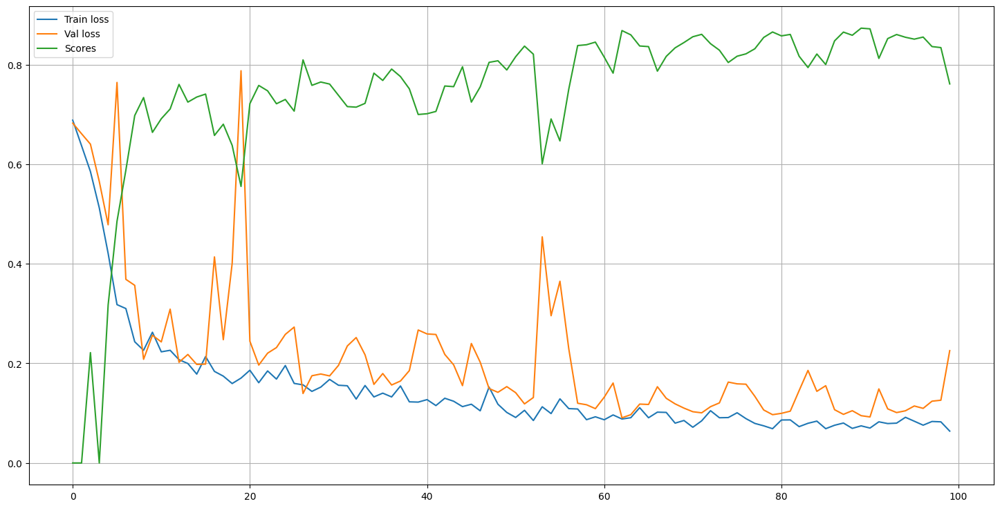

In [ ]:
plt.figure(figsize=(18, 9))
plt.plot(np.arange(len(train_losses)), train_losses, label='Train loss')
plt.plot(np.arange(len(val_losses)), val_losses, label='Val loss')
plt.plot(np.arange(len(scores)), scores, label='Scores')
plt.legend()
plt.grid()
plt.show()

In [ ]:
max(scores)

0.8731400370597839

## Шаг 6. Инференс [1 балл]

После обучения модели напишите функцию теста, воспользуйтесь лучшим чекпоинтом и протестируйте работу модели на тестовой выборке.

In [ ]:
best_model = SegNet().to(device)
best_model.load_state_dict(torch.load('best_model_default.pth'))

<All keys matched successfully>

Будем отрисовывать первый элемент из батча, а также считать loss и IoU score

In [43]:
def test(model, dataloader, criterion, metric):
    model.eval()
    total_loss = 0.0
    metric.reset()

    with torch.no_grad():
        for x_batch, y_batch in tqdm(dataloader):
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)

            outp = model(x_batch)
            loss = criterion(outp, y_batch)
            total_loss += loss.item()

            probs = (torch.sigmoid(outp) > 0.5).float()
            metric.update(probs, y_batch)

            fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(6, 8))
            ax1.title.set_text('Real')
            ax1.imshow(np.transpose(x_batch[0].cpu().numpy(), (1, 2, 0)))
            ax2.title.set_text('Target')
            ax2.imshow(y_batch[0, 0].cpu().numpy(), cmap='gray')
            ax3.title.set_text('Predicted')
            ax3.imshow(probs[0, 0].cpu().numpy(), cmap='gray')

    avg_loss = total_loss / len(dataloader)
    score = metric.compute().item()

    return avg_loss, score

  0%|          | 0/2 [00:00<?, ?it/s]

(0.20951350033283234, 0.8418874740600586)

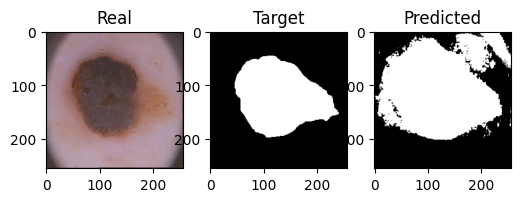

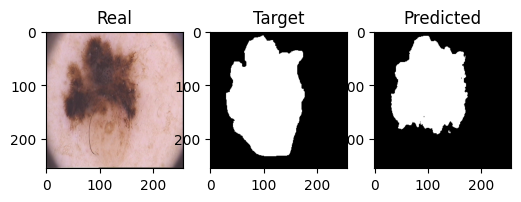

In [ ]:
test(best_model, test_dataloader, criterion, iou_score)

# Задания: Мир других лоссов!

## Пробуем другие функции потерь [2 балла]

В данном разделе вам потребуется имплементировать две функции потерь: DICE и Focal loss.


### Dice Loss

**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

В терминах матрицы ошибок она будет считаться следующим образом:

$$D(X,Y) = \frac{2TP}{2TP + FP + FN}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1- D(X, Y)$$

**Hints** (!):

1. Не забудьте подумать о численной нестабильности, возникающей в математической формуле при ситуации, когда $\frac{0}{0}$, т.е. вам нужно добавить очень маленькое число, например $\epsilon = 1e^{-8}$, в обе части дроби при подсчете $D(X,Y)$:

$$D(X,Y) = \frac{2TP + ϵ}{2TP + FP + FN + ϵ}$$

2. Dice метрика(!), не лосс, считается похожим образом как IoU:

    2.1. На вход вам приходят logits, т.е. значения от $-∞$ до $∞$. Их переводим в вероятности от 0 до 1 при помощи функции Sigmoid.

    2.2. Фиксируем порог, например threshold=0.5, и всему что ниже порога ставим значение 0, всему что выше 1. Получаем предсказанную маску из 0 и 1.

    2.3. Считаем TP, FP, FN

    2.4. Считаем DICE метрику по формуле

Вы можете прописать для себя функцию `dice_score()` и сравнить с результатами работы функции из библиотеки `torchmetrics`.

3. Но с метрикой есть проблема, что она не дифференцируема, и если вы захотите просто взять и прописать `dice_loss` = 1 - `dice_score`, Pytorch поругается на вас и скажет, что это недифференцируемая метрика. Чтобы посчитать dice_loss делаем следующие шаги:

    3.1. На вход вам приходят logits, т.е. значения от $-∞$ до $∞$. Их переводим в вероятности от 0 до 1 при помощи функции Sigmoid.

    3.2. Здесь нам уже не нужно фиксировать порог, мы просто работаем с вероятностями. Значения вероятностей дифференцируемы и через них будут протекать градиенты.

    3.3. Считаем TP, FP, FN также как и в Dice метрике, только вместо маски, подаем вероятности.

    3.4. Считаем DICE метрику по формуле

    3.5. Считаем лосс как Loss = 1 - DICE

Итак, давайте сначала пропишем dice_score.

In [29]:
def dice_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5):
    '''
    Это именно метрика, не лосс.
    '''
    eps = 1e-8
    probs = (torch.sigmoid(logits) > threshold).float()

    tp = torch.sum(torch.logical_and(labels == probs, labels == True))
    fp = torch.sum(torch.logical_and(probs == True, labels == False))
    fn = torch.sum(torch.logical_and(probs == False, labels == True))

    return (2 * tp + eps) / (2 * tp + fp + fn + eps)

Проверим на корректность функцию dice_score:

In [30]:
from torchmetrics.classification import Dice

dice = Dice(average='micro').to(device)
dice(dummpy_sample['logits'].sigmoid(), dummpy_sample['labels'].to(int))

tensor(0.6667, device='cuda:0')

In [31]:
assert dice(dummpy_sample['logits'].sigmoid(), dummpy_sample['labels'].to(int)) == dice_score(dummpy_sample['logits'], dummpy_sample['labels'])

Давайте теперь пропишем лосс и воспользуемся библиотекой `segmentation-models-pytorch`, чтобы убедиться в корректности нашей функции.

In [32]:
def dice_loss(logits: torch.Tensor, labels: torch.Tensor):

    '''
    Это лосс.
    '''
    eps = 1e-8
    probs = torch.sigmoid(logits)
    tp = torch.sum(probs * labels)
    fp = torch.sum(probs * (1 - labels))
    fn = torch.sum((1 - probs) * labels)

    return 1 - (2 * tp + eps) / (2 * tp + fp + fn + eps)

In [33]:
dice_loss(dummpy_sample['logits'], dummpy_sample['labels'])

tensor(0.5756, device='cuda:0')

Проверка на корректность:

In [34]:
# проверьте, что у вас установлена библиотека
!pip install segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 5.6 MB/s eta 0:00:00


In [35]:
from segmentation_models_pytorch.losses import DiceLoss
dice_loss_torch = DiceLoss(mode='binary')
dice_loss_torch(dummpy_sample['logits'], dummpy_sample['labels'])

tensor(0.5756, device='cuda:0')

In [36]:
assert dice_loss_torch(dummpy_sample['logits'], dummpy_sample['labels'].to(int)) == dice_loss(dummpy_sample['logits'], dummpy_sample['labels'])

### Focal Loss

[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf)

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.


Из оригинальной статьи по [Focal Loss](https://arxiv.org/pdf/1708.02002.pdf):

$$p_t = \sigma(\hat y_i)y_i + (1 - \sigma(\hat y_i)) (1-y_i)$$

$$\mathcal L_{focal}(y, \hat y) = (1 - p_t)^{\gamma} \mathcal L_{BCE}(y_i, \hat y_i).$$

$$\mathcal L_{focal}(y, \hat y) = -\sum_i (1 - p_t)^{\gamma} \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

$$\mathcal L_{focal}(y, \hat y) = -\sum_i (1 - (\sigma(\hat y_i)y_i + (1 - \sigma(\hat y_i)) (1-y_i)))^{\gamma} \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

In [37]:
def focal_loss(y_real, y_pred, eps = 1e-8, gamma = 2):
    return -torch.sum((1 - (y_real * torch.sigmoid(y_pred) + (1 - y_real) * (1 - torch.sigmoid(y_pred)))) ** gamma * (y_real * torch.log(torch.sigmoid(y_pred)) + (1 - y_real) * torch.log(1 - torch.sigmoid(y_pred))))

In [38]:
focal_loss(dummpy_sample['labels'], dummpy_sample['logits'], gamma=2.0)

tensor(3.6161, device='cuda:0')

Проверка корректности функции:

In [39]:
from torchvision.ops import sigmoid_focal_loss
sigmoid_focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], alpha=-1, gamma=2, reduction='sum')

tensor(3.6161, device='cuda:0')

Воспользуемся np.isclose, так как могут быть небольшие различия в точности

In [40]:
assert np.isclose(sigmoid_focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], alpha=-1, gamma=2, reduction='sum').cpu(), focal_loss(dummpy_sample['labels'], dummpy_sample['logits'], gamma=2.0).cpu())

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее, и провести численное сравнение с предыдущими функциями.
 **ВАЖНО:** за имплементацию одного лосса выдается только один балл. Чтобы получить все 5 баллов, будет необходимо имплементировать все 5 лоссов.

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

Loss1 - Physiological Inspired Loss

$\bar P$ - среднее значение сигмоид

$ L = L_{BCE} + \lambda (\bar P - s)^2$



In [134]:
class PhysiologicalEmotionLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.ce = nn.BCEWithLogitsLoss()

    def forward(self, pred, target, physio_signal=None):
        ce_loss = self.ce(pred, target)

        physio_loss = 0.0
        if physio_signal is not None:
            physio_loss = F.mse_loss(prob.mean(), physio_signal)

        return ce_loss + physio_loss

In [135]:
physiological_loss = PhysiologicalEmotionLoss()
physiological_loss(torch.sigmoid(dummpy_sample['logits']), dummpy_sample['labels'])

tensor(0.7010, device='cuda:0')

Loss2 - Boundary loss

$p(x)$ - вероятность принадлежности пикселя классу

$\phi_G(x)$ - signed distance map (distance transform)


$L_{boundary} = \int_{\Omega}\phi_G(x)p(x)dx$

В дискретном виде: $L_{boundary} = {1 \over N} \sum_i\phi_i p_i$

In [97]:
class BoundaryLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, pred, dist_map):
        loss = (pred * dist_map).mean()
        return loss

In [103]:
boundary_loss = BoundaryLoss()
boundary_loss(torch.sigmoid(dummpy_sample['logits']), dummpy_sample['labels'])

tensor(0.0696, device='cuda:0')

Loss3 - Tversky loss

$ TL = 1 - {{TP} \over {TP + \alpha FP + \beta FN}}$

При $\alpha = \beta = 0.5$ ~ Dice loss

In [100]:
class TverskyLoss(nn.Module):
    def __init__(self, alpha=0.5, beta=0.5, smooth=1e-6):
        super().__init__()
        self.alpha = alpha
        self.beta = beta
        self.smooth = smooth

    def forward(self, pred, target):
        pred = pred.view(-1)
        target = target.view(-1)

        TP = (pred * target).sum()
        FP = ((1 - target) * pred).sum()
        FN = (target * (1 - pred)).sum()

        tversky = (TP + self.smooth) / (
            TP + self.alpha * FP + self.beta * FN + self.smooth
        )

        return 1 - tversky

In [102]:
tversky_loss = TverskyLoss()
tversky_loss(torch.sigmoid(dummpy_sample['logits']), dummpy_sample['labels'])

tensor(0.5756, device='cuda:0')

Loss4 - CMSS

$SSIM(x, y) = {{2\mu_x\mu_y + C_1} \over {\mu_x^2 + \mu_y^2 + C_1}} \cdot {{2\sigma_{xy} + C_2} \over {\sigma_x^2 + \sigma_y^2 + C_1}}$

$L = 1 - SSIM + \lambda(1 - Corr)$

In [115]:
class CMSSIMLoss(nn.Module):
    def __init__(self, lambda_corr=0.5, eps=1e-6):
        super().__init__()
        self.lambda_corr = lambda_corr
        self.eps = eps

    def forward(self, pred, target):
        mu_x = pred.mean()
        mu_y = pred.mean()
        sigma_x = pred.var()
        sigma_y = pred.var()
        sigma_xy = ((pred - mu_x) * (pred - mu_y)).mean()

        c1 = 1e-4
        c2 = 2e-4

        ssim = ((2 * mu_x * mu_y + c1) * (2 * sigma_xy + c2)) / ((mu_x**2 + mu_y**2 + c1) * (sigma_x + sigma_y + c2))

        covariance = ((pred - mu_x) * (target - mu_y)).mean()

        pred_std = pred.std()
        target_std = target.std()

        corr = covariance / (pred_std * target_std + self.eps)
        return 1 - ssim + self.lambda_corr * (1 - corr)

In [116]:
cmss_loss = CMSSIMLoss()
cmss_loss(torch.sigmoid(dummpy_sample['logits']), dummpy_sample['labels'])

tensor(0.2998, device='cuda:0')

Loss5 - Topology

$L = L_{seg} + \lambda L_{topology} $

В качестве $L_{seg}$ возьмём обычный BCELoss. $L_{topology}$ будем аппроксимировать.

In [120]:
class TopologyPreservingLoss(nn.Module):
    def __init__(self, lambda_topo=1.0):
        super().__init__()
        self.lambda_topo = lambda_topo
        self.bce = nn.BCELoss()

    def soft_dilation(self, x):
        kernel = torch.ones((1, 1, 3, 3), device=x.device)
        return F.conv2d(x, kernel, padding=1).clamp(0, 1)

    def forward(self, pred, target):
        seg_loss = self.bce(pred, target)

        pred_dil = self.soft_dilation(pred)
        target_dil = self.soft_dilation(target)

        topo_loss = F.l1_loss(pred_dil, target_dil)

        return seg_loss + self.lambda_topo * topo_loss

In [121]:
topology_loss = TopologyPreservingLoss()
topology_loss(torch.sigmoid(dummpy_sample['logits']), dummpy_sample['labels'])

tensor(0.5636, device='cuda:0')

## Обучите SegNet на новых лоссах

**Задание**: обучите SegNet на новых лоссах и сравните все три лосса:
*   При каком лоссе модель сходится быстрее?
*   При каком лоссе модель выдает наилучшую метрику?

Напишите развернутый ответ на вопросы.



In [ ]:
torch.cuda.empty_cache()

In [ ]:
model2 = SegNet().to(device)
optimizer2 = torch.optim.Adam(model2.parameters(), lr=1e-3)
criterion2 = DiceLoss(mode='binary')
num_epoch = 100
dataloaders = {'train': train_dataloader, 'val': valid_dataloader}

In [ ]:
train_losses2, val_losses2, scores2 = train(model2, dataloaders, optimizer2, criterion2, iou_score, num_epoch, 'Dice')

Epoch 1


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.6221423596143723


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.6480216383934021
Score 0.2697213888168335
Epoch 2


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.5555254966020584


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.6461756229400635
Score 0.26977434754371643
Epoch 3


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.44856154918670654


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.6441603899002075
Score 0.1587209403514862
Epoch 4


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.369090273976326


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.6382783055305481
Score 0.1274038553237915
Epoch 5


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.31781621277332306


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.6585904657840729
Score 0.155705064535141
Epoch 6


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.30364377796649933


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.5686803758144379
Score 0.2779058516025543
Epoch 7


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.23427550494670868


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.41560250520706177
Score 0.4329011142253876
Epoch 8


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.2171916961669922


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2409803569316864
Score 0.6558632850646973
Epoch 9


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.19387665390968323


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2476460039615631
Score 0.6606262922286987
Epoch 10


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.16562111675739288


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2166854441165924
Score 0.6847726702690125
Epoch 11


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1716100424528122


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20451223850250244
Score 0.6857843995094299
Epoch 12


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1403932273387909


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2193138301372528
Score 0.6563575267791748
Epoch 13


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.16817021369934082


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17539441585540771
Score 0.7206420302391052
Epoch 14


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.14599625766277313


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17948660254478455
Score 0.7136592864990234
Epoch 15


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.14095978438854218


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.22681671380996704
Score 0.6370340585708618
Epoch 16


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1678868979215622


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17407694458961487
Score 0.710029661655426
Epoch 17


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13879433274269104


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.15743574500083923
Score 0.7342819571495056
Epoch 18


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13219018280506134


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.15550750494003296
Score 0.7378249764442444
Epoch 19


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1305246353149414


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2254730761051178
Score 0.6346863508224487
Epoch 20


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12153306603431702


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2186846137046814
Score 0.6437108516693115
Epoch 21


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11922650039196014


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17533975839614868
Score 0.7057092189788818
Epoch 22


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12112121284008026


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.26224973797798157
Score 0.5872973203659058
Epoch 23


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13385385274887085


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3394376039505005
Score 0.493747353553772
Epoch 24


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1198556125164032


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.19835713505744934
Score 0.6719759106636047
Epoch 25


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11806291341781616


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.13191744685173035
Score 0.7713283896446228
Epoch 26


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11029253900051117


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.12114176154136658
Score 0.7883444428443909
Epoch 27


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11503355205059052


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.19538411498069763
Score 0.6760992407798767
Epoch 28


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12717999517917633


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.31959861516952515
Score 0.5174192786216736
Epoch 29


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13368315994739532


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.37725284695625305
Score 0.45347660779953003
Epoch 30


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13421697914600372


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.4482938349246979
Score 0.38106998801231384
Epoch 31


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13368047773838043


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.14114010334014893
Score 0.756790816783905
Epoch 32


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11044865846633911


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.12371605634689331
Score 0.7855456471443176
Epoch 33


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11211080849170685


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1279163360595703
Score 0.780727207660675
Epoch 34


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11946405470371246


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.47721099853515625
Score 0.3560783863067627
Epoch 35


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13606101274490356


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.12840813398361206
Score 0.7821915745735168
Epoch 36


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10595111548900604


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16983798146247864
Score 0.7124253511428833
Epoch 37


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10630975663661957


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.21752020716667175
Score 0.6440762281417847
Epoch 38


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10117985308170319


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16072577238082886
Score 0.7253222465515137
Epoch 39


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09349119663238525


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18437403440475464
Score 0.6906808614730835
Epoch 40


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10789068043231964


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.194064199924469
Score 0.6766427159309387
Epoch 41


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09455372393131256


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2607479989528656
Score 0.5871463418006897
Epoch 42


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08937273919582367


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1664045751094818
Score 0.7158253192901611
Epoch 43


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09240014851093292


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.13756805658340454
Score 0.7600101828575134
Epoch 44


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09563587605953217


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16540423035621643
Score 0.7162295579910278
Epoch 45


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09203851222991943


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.22120007872581482
Score 0.6386928558349609
Epoch 46


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08311782777309418


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24437955021858215
Score 0.6083291172981262
Epoch 47


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08728571236133575


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1826452910900116
Score 0.6942394971847534
Epoch 48


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08675767481327057


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.12376436591148376
Score 0.7817742228507996
Epoch 49


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09559758007526398


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.114411860704422
Score 0.7972222566604614
Epoch 50


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08131599426269531


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11409127712249756
Score 0.7988365292549133
Epoch 51


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09057892858982086


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.12706667184829712
Score 0.7771853804588318
Epoch 52


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09736134111881256


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10844960808753967
Score 0.8070613145828247
Epoch 53


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08529596030712128


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.12345317006111145
Score 0.7821004986763
Epoch 54


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08485634624958038


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.41801923513412476
Score 0.4106695055961609
Epoch 55


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09443610906600952


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18518754839897156
Score 0.6882075071334839
Epoch 56


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08526775240898132


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.12057408690452576
Score 0.7867939472198486
Epoch 57


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09219981729984283


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11545273661613464
Score 0.7951334118843079
Epoch 58


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07578103244304657


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1212087869644165
Score 0.784394383430481
Epoch 59


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09085610508918762


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.150050550699234
Score 0.7395875453948975
Epoch 60


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09224703907966614


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11067116260528564
Score 0.8016075491905212
Epoch 61


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07251040637493134


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1687365472316742
Score 0.7115042805671692
Epoch 62


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13138896226882935


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.5321631133556366
Score 0.3050772547721863
Epoch 63


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13330025970935822


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.33906635642051697
Score 0.4929382801055908
Epoch 64


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.18826141953468323


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.32931017875671387
Score 0.5142054557800293
Epoch 65


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13730907440185547


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24943098425865173
Score 0.6023966670036316
Epoch 66


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12343037128448486


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.15544381737709045
Score 0.7327226996421814
Epoch 67


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1301337331533432


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.15053516626358032
Score 0.7400251030921936
Epoch 68


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12259452044963837


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1253800094127655
Score 0.7788732051849365
Epoch 69


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11225274205207825


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11794653534889221
Score 0.7908642292022705
Epoch 70


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1074099987745285


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1305328607559204
Score 0.7719943523406982
Epoch 71


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10906872153282166


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.13977599143981934
Score 0.7576100826263428
Epoch 72


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10503005981445312


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.13178333640098572
Score 0.7708423733711243
Epoch 73


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11237139999866486


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.12310323119163513
Score 0.784070611000061
Epoch 74


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09343239665031433


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.37829601764678955
Score 0.45228517055511475
Epoch 75


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09818057715892792


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.13568058609962463
Score 0.7622030377388
Epoch 76


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09424372017383575


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2601676285266876
Score 0.5880958437919617
Epoch 77


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09648485481739044


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24269750714302063
Score 0.6103387475013733
Epoch 78


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.077816441655159


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.22811049222946167
Score 0.6294451951980591
Epoch 79


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08522064983844757


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18904319405555725
Score 0.6829932332038879
Epoch 80


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07920800149440765


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10807082056999207
Score 0.8066118359565735
Epoch 81


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0838281512260437


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.0963374674320221
Score 0.8271043300628662
Epoch 82


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0812796801328659


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09928467869758606
Score 0.8219638466835022
Epoch 83


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10090091824531555


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11846163868904114
Score 0.7916809916496277
Epoch 84


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10769905149936676


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09821340441703796
Score 0.8256851434707642
Epoch 85


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09156204760074615


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1107109785079956
Score 0.8049657940864563
Epoch 86


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08499059081077576


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1430700123310089
Score 0.7601211071014404
Epoch 87


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10531996190547943


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11028814315795898
Score 0.8094546794891357
Epoch 88


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08727072179317474


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09724792838096619
Score 0.8264709711074829
Epoch 89


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07972444593906403


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10875272750854492
Score 0.8059242963790894
Epoch 90


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08815155923366547


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.22453579306602478
Score 0.6340505480766296
Epoch 91


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08902491629123688


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20504522323608398
Score 0.6602010726928711
Epoch 92


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07728183269500732


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11335927248001099
Score 0.7974249124526978
Epoch 93


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07069507241249084


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09493035078048706
Score 0.8294664621353149
Epoch 94


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08124570548534393


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10070633888244629
Score 0.8197706341743469
Epoch 95


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07015657424926758


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09663665294647217
Score 0.8261739015579224
Epoch 96


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07512333989143372


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1440480649471283
Score 0.7496327757835388
Epoch 97


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07328122854232788


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2768692076206207
Score 0.5672516226768494
Epoch 98


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09845899045467377


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.14377278089523315
Score 0.7494421601295471
Epoch 99


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0881861001253128


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16077154874801636
Score 0.7233580946922302
Epoch 100


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09126649796962738


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17111417651176453
Score 0.708594024181366


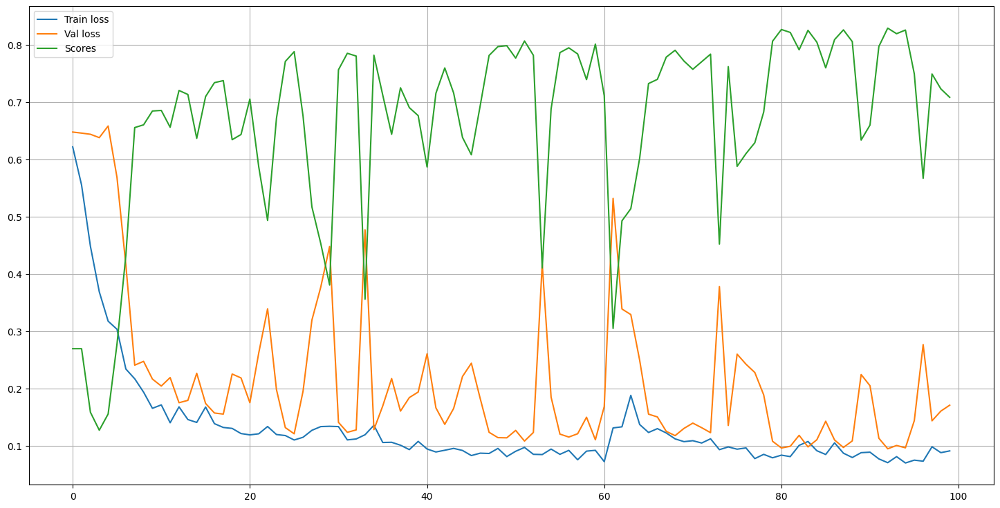

In [ ]:
plt.figure(figsize=(18, 9))
plt.plot(np.arange(len(train_losses2)), train_losses2, label='Train loss')
plt.plot(np.arange(len(val_losses2)), val_losses2, label='Val loss')
plt.plot(np.arange(len(scores2)), scores2, label='Scores')
plt.legend()
plt.grid()
plt.show()

In [ ]:
max(scores2)

0.8294664621353149

In [ ]:
best_model2 = SegNet().to(device)
best_model2.load_state_dict(torch.load('best_model_Dice.pth'))

<All keys matched successfully>

  0%|          | 0/2 [00:00<?, ?it/s]

(0.11312773823738098, 0.7974453568458557)

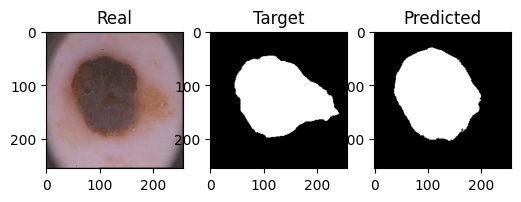

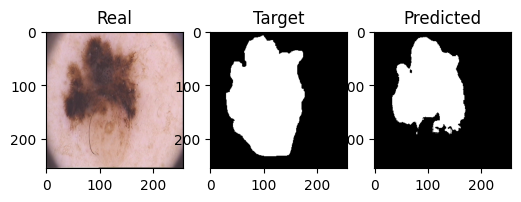

In [ ]:
test(best_model2, test_dataloader, criterion2, iou_score)

In [ ]:
model3 = SegNet().to(device)
optimizer3 = torch.optim.Adam(model3.parameters(), lr=1e-3)
criterion3 = lambda x, y: sigmoid_focal_loss(
    x,
    y,
    reduction="mean"
)
num_epoch = 100
dataloaders = {'train': train_dataloader, 'val': valid_dataloader}

In [ ]:
train_losses3, val_losses3, scores3 = train(model3, dataloaders, optimizer3, criterion3, iou_score, num_epoch, 'sigmoid')

Epoch 1


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11037776246666908


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10163883119821548
Score 0.0
Epoch 2


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06867935787886381


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.26376739144325256
Score 0.3334531784057617
Epoch 3


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0544633474200964


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.06884435564279556
Score 0.0
Epoch 4


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.049782849848270416


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.23373369127511978
Score 0.16053542494773865
Epoch 5


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.04826375097036362


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08130151778459549
Score 0.18540841341018677
Epoch 6


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0430925814434886


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.047791117802262306
Score 0.25791555643081665
Epoch 7


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.03691196162253618


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.041355378925800323
Score 0.379202276468277
Epoch 8


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.03447406692430377


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.032078430987894535
Score 0.5180051326751709
Epoch 9


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.03414896735921502


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.030843062326312065
Score 0.5472915172576904
Epoch 10


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0321567696519196


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.03655681759119034
Score 0.3782866895198822
Epoch 11


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.03142970707267523


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.03546595945954323
Score 0.10466690361499786
Epoch 12


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.027520801872015


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.028765279799699783
Score 0.510399580001831
Epoch 13


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.024622279219329357


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.026629255153238773
Score 0.5636312365531921
Epoch 14


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.025142709724605083


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.025313761085271835
Score 0.5662143230438232
Epoch 15


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.023742555640637875


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.023071677424013615
Score 0.6497908234596252
Epoch 16


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.022705739364027977


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.023579908534884453
Score 0.5996043086051941
Epoch 17


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.02971301320940256


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.03236588556319475
Score 0.3468672037124634
Epoch 18


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.02602608408778906


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.05936433933675289
Score 0.024911463260650635
Epoch 19


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.026568337343633175


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.06950841099023819
Score 8.48586205393076e-05
Epoch 20


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.024945086799561977


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.07909995689988136
Score 0.00018555625865701586
Epoch 21


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.02520941197872162


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.07798556238412857
Score 0.0003925592463929206
Epoch 22


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.024592827539891005


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.06070678494870663
Score 0.06854061037302017
Epoch 23


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.022521921433508396


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.05623902939260006
Score 0.10827961564064026
Epoch 24


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.024579312186688185


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02134991902858019
Score 0.6267658472061157
Epoch 25


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.023130727466195822


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02407766319811344
Score 0.5444434285163879
Epoch 26


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.020525995641946793


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.021701487712562084
Score 0.6423982381820679
Epoch 27


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.021595997735857964


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02235185820609331
Score 0.5960516333580017
Epoch 28


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.019686631159856915


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.020099961198866367
Score 0.6853452324867249
Epoch 29


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.02196737239137292


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01934791635721922
Score 0.7032653093338013
Epoch 30


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.018596832640469074


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.019610163755714893
Score 0.7187367677688599
Epoch 31


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.02061877935193479


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.018488391302525997
Score 0.6920607686042786
Epoch 32


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.017763949697837234


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.018212213180959225
Score 0.6912098526954651
Epoch 33


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.018365988973528147


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.020687054842710495
Score 0.7547659277915955
Epoch 34


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0199359143152833


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.026343494653701782
Score 0.6513871550559998
Epoch 35


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0184206897392869


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02424981165677309
Score 0.7642317414283752
Epoch 36


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01792576815932989


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.028253236785531044
Score 0.7411378622055054
Epoch 37


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.016824333928525448


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.0185863571241498
Score 0.7361540794372559
Epoch 38


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.015186788281425834


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.022081663832068443
Score 0.6600237488746643
Epoch 39


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01838222937658429


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.025345616973936558
Score 0.6015872359275818
Epoch 40


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.018912556115537882


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02149933483451605
Score 0.6558430790901184
Epoch 41


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.022034689085558057


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.023524093441665173
Score 0.7094137072563171
Epoch 42


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01774552883580327


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02209404483437538
Score 0.7151539325714111
Epoch 43


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01675606332719326


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.023031449876725674
Score 0.7130265235900879
Epoch 44


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.016938671004027128


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.038398200646042824
Score 0.6554412245750427
Epoch 45


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.015334136551246047


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.04244108684360981
Score 0.6509413123130798
Epoch 46


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.013797672465443611


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.05845301039516926
Score 0.46325233578681946
Epoch 47


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014632407110184431


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.04578382894396782
Score 0.6588839888572693
Epoch 48


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.018348510842770338


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.04358082264661789
Score 0.7243403196334839
Epoch 49


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.017017581965774298


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1587173193693161
Score 0.3961945176124573
Epoch 50


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.016910219797864556


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.04857418313622475
Score 0.6367241144180298
Epoch 51


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014233395457267761


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02280114870518446
Score 0.7127321362495422
Epoch 52


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.021104158833622932


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.029375094920396805
Score 0.6836912631988525
Epoch 53


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01780693233013153


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02994221169501543
Score 0.7255045175552368
Epoch 54


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0180284280795604


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.018760697916150093
Score 0.7105640769004822
Epoch 55


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01439977646805346


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.018060418777167797
Score 0.7413225769996643
Epoch 56


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.013621807796880603


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02460589725524187
Score 0.6914528012275696
Epoch 57


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.013231099816039205


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.07920524850487709
Score 0.578671932220459
Epoch 58


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.012237364426255226


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.056243957951664925
Score 0.746426522731781
Epoch 59


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01475363620556891


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.056984780356287956
Score 0.6003538966178894
Epoch 60


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014086343348026276


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.06405119225382805
Score 0.5811402201652527
Epoch 61


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.015924610663205385


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.021969081833958626
Score 0.7048932909965515
Epoch 62


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.017152433516457677


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.037481870502233505
Score 0.462238609790802
Epoch 63


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0181316954549402


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.04387841001152992
Score 0.3960101306438446
Epoch 64


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.015824538888409734


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.015076675917953253
Score 0.7516782283782959
Epoch 65


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014928307617083192


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.016014818102121353
Score 0.7768590450286865
Epoch 66


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.015806781593710184


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.020285875536501408
Score 0.7032667398452759
Epoch 67


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.019164608791470528


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.022385806310921907
Score 0.7650599479675293
Epoch 68


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.016564116580411792


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01963507616892457
Score 0.7665064334869385
Epoch 69


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014874591026455164


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.04434953071177006
Score 0.6596577763557434
Epoch 70


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014127636095508933


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.5455929040908813
Score 0.3043196499347687
Epoch 71


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01659822929650545


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.14322032779455185
Score 0.4143800139427185
Epoch 72


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.016361868707463145


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10818582773208618
Score 0.5389208197593689
Epoch 73


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01610235753469169


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08039500936865807
Score 0.6473873853683472
Epoch 74


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.015700809191912413


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.015103823971003294
Score 0.7650661468505859
Epoch 75


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.016322636511176825


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01619649026542902
Score 0.7390692234039307
Epoch 76


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011835910845547915


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.017036305274814367
Score 0.7274976372718811
Epoch 77


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.013102350756525993


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.018622014671564102
Score 0.7096711993217468
Epoch 78


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.015357371419668198


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.0207434156909585
Score 0.5926306843757629
Epoch 79


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.012788784690201283


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.036790213547647
Score 0.6714906096458435
Epoch 80


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.013468771940097213


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01976504549384117
Score 0.7181445956230164
Epoch 81


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.012568000238388777


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.018950038123875856
Score 0.7290568947792053
Epoch 82


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011183889349922538


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.015962968580424786
Score 0.741296648979187
Epoch 83


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0114636963699013


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.013706385158002377
Score 0.7829248309135437
Epoch 84


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.010641742032021284


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01899886131286621
Score 0.696819007396698
Epoch 85


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011147443670779467


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.019805357325822115
Score 0.7036101818084717
Epoch 86


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.016315934248268604


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 3.848706603050232
Score 0.2749618887901306
Epoch 87


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.028133350890129805


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11115481331944466
Score 0.5278858542442322
Epoch 88


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.02600574493408203


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.03671915642917156
Score 0.43400847911834717
Epoch 89


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.021927709225565195


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02418879233300686
Score 0.6946284770965576
Epoch 90


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.020153870806097984


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.04331246763467789
Score 0.6917456984519958
Epoch 91


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.020019914489239454


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.05458984337747097
Score 0.6242882013320923
Epoch 92


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.016201555030420423


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09126868844032288
Score 0.563366711139679
Epoch 93


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014376523438841105


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.13745084404945374
Score 0.5789514780044556
Epoch 94


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014007926918566227


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08315137028694153
Score 0.7071132063865662
Epoch 95


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014213449787348509


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.030467620119452477
Score 0.7469949126243591
Epoch 96


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.013937827199697495


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.024598357267677784
Score 0.7423417568206787
Epoch 97


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01944201858714223


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.015694275498390198
Score 0.7670196294784546
Epoch 98


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.015747881028801203


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.016102483496069908
Score 0.7286128997802734
Epoch 99


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.018920656759291887


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.017115690279752016
Score 0.6934098601341248
Epoch 100


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.015169384190812707


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01721459487453103
Score 0.716390073299408


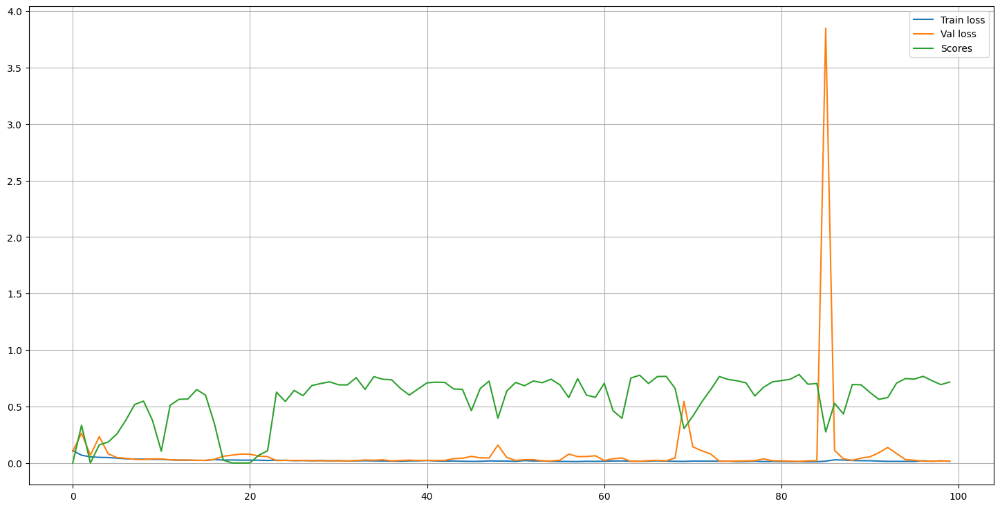

In [ ]:
plt.figure(figsize=(18, 9))
plt.plot(np.arange(len(train_losses3)), train_losses3, label='Train loss')
plt.plot(np.arange(len(val_losses3)), val_losses3, label='Val loss')
plt.plot(np.arange(len(scores3)), scores3, label='Scores')
plt.legend()
plt.grid()
plt.show()

In [ ]:
best_model3 = SegNet().to(device)
best_model3.load_state_dict(torch.load('best_model_sigmoid.pth'))

<All keys matched successfully>

  0%|          | 0/2 [00:00<?, ?it/s]

(0.0235092556104064, 0.7495318651199341)

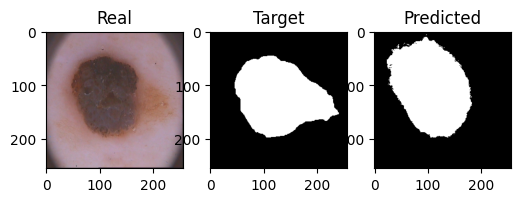

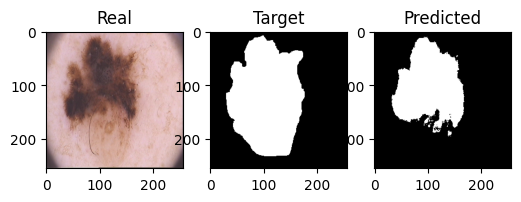

In [ ]:
test(best_model3, test_dataloader, criterion3, iou_score)

На BCEWithLogitsLoss модель сошлась примерно за 50 эпох, и показав на тестовой выборке loss ~ 0.21 и метрику IoU ~ 0.84

На DiceLoss модель сошлась примерно за 30 эпох, хотя, переодически val_loss резко увеличивался, и показав на тестовой выборке loss ~ 0.11 и метрику IoU ~ 0.79

На BCEWithLogitsLoss модель сошлась примерно за 15 эпох, показав на тестовой выборке loss ~ 0.02 и метрику IoU ~ 0.75

# Задание: Новая модель!

## Модель U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

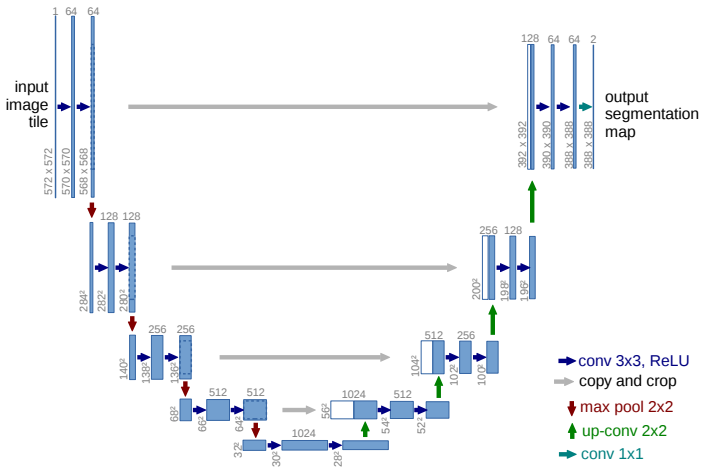

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

В оригинальной статье авторы не использовали padding внутри модели (это видно по тому, что размеры карты признаков уменьшаются на 2 каждый раз при движении от слоя к слою). При этом размеры входных изображений авторы единоразово увеличили при помощи mirror padding.

В этом домашнем задании вы можете применить альтернативный подход - сохранять размеры карт признаков при помощью padding = 1 во внутренних слоях.  

In [41]:
import torch.nn.functional as F
import torch.nn as nn

Для реализации UNet вы можете написать классы блоков энкодера и декодера отдельно, как мы сделали при реализации SegNet.

In [63]:
class DoubleConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, padding=1):
        super(DoubleConvLayer, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)


In [70]:
class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels = 1, num_features = 64):
        super().__init__()

        num_features_2 = num_features * 2
        num_features_3 = num_features_2 * 2
        num_features_4 = num_features_3 * 2
        num_features_5 = num_features_4 * 2

        self.encoder1 = DoubleConvLayer(in_channels, num_features)
        self.encoder2 = DoubleConvLayer(num_features, num_features_2)
        self.encoder3 = DoubleConvLayer(num_features_2, num_features_3)
        self.encoder4 = DoubleConvLayer(num_features_3, num_features_4)

        self.maxpooling = nn.MaxPool2d(2)

        self.bottleneck = DoubleConvLayer(num_features_4, num_features_5)

        self.maxunpooling4 = nn.ConvTranspose2d(num_features_5, num_features_4, 2, stride=2)
        self.decoder4 = DoubleConvLayer(num_features_5, num_features_4)

        self.maxunpooling3 = nn.ConvTranspose2d(num_features_4, num_features_3, 2, stride=2)
        self.decoder3 = DoubleConvLayer(num_features_4, num_features_3)

        self.maxunpooling2 = nn.ConvTranspose2d(num_features_3, num_features_2, 2, stride=2)
        self.decoder2 = DoubleConvLayer(num_features_3, num_features_2)

        self.maxunpooling1 = nn.ConvTranspose2d(num_features_2, num_features, 2, stride=2)
        self.decoder1 = DoubleConvLayer(num_features_2, num_features)

        self.output = nn.Conv2d(num_features, out_channels, 1)

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.maxpooling(enc1))
        enc3 = self.encoder3(self.maxpooling(enc2))
        enc4 = self.encoder4(self.maxpooling(enc3))

        b = self.bottleneck(self.maxpooling(enc4))

        dec4 = self.maxunpooling4(b)
        dec4 = torch.cat([dec4, enc4], dim=1)
        dec4 = self.decoder4(dec4)

        dec3 = self.maxunpooling3(dec4)
        dec3 = torch.cat([dec3, enc3], dim=1)
        dec3 = self.decoder3(dec3)

        dec2 = self.maxunpooling2(dec3)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.decoder2(dec2)

        dec1 = self.maxunpooling1(dec2)
        dec1 = torch.cat([dec1, enc1], dim=1)
        dec1 = self.decoder1(dec1)

        output = self.output(dec1)

        return output

In [71]:
unet_model = UNet().to(device)

In [72]:
optimizer = torch.optim.Adam(unet_model.parameters(), lr=1e-3)
criterion = nn.BCEWithLogitsLoss(reduction='mean')
num_epoch = 100
dataloaders = {'train': train_dataloader, 'val': valid_dataloader}

In [73]:
train_losses, val_losses, scores = train(unet_model, dataloaders, optimizer, criterion, iou_score, num_epoch, 'default')

Epoch 1


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.524872712790966


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.6634222269058228
Score 6.516420398838818e-05
Epoch 2


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.3783528059720993


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.5724499821662903
Score 0.1316959261894226
Epoch 3


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.31600984930992126


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.5560129880905151
Score 0.011086049489676952
Epoch 4


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.2953977510333061


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.5230712890625
Score 0.01151091605424881
Epoch 5


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.2844259925186634


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.4948122799396515
Score 0.09418337792158127
Epoch 6


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.2585809640586376


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.5104144364595413
Score 0.055112872272729874
Epoch 7


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.25377174466848373


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.4987640529870987
Score 0.21249906718730927
Epoch 8


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.2646678797900677


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3642738461494446
Score 0.5241202712059021
Epoch 9


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.2354281060397625


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2574150785803795
Score 0.7093268632888794
Epoch 10


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.22036485746502876


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.29985855519771576
Score 0.7098891735076904
Epoch 11


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.21443870663642883


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2700006365776062
Score 0.7311939001083374
Epoch 12


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.22838999703526497


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2595387473702431
Score 0.7531300187110901
Epoch 13


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.19957321882247925


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24483982473611832
Score 0.733955442905426
Epoch 14


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.19590381905436516


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.25411710888147354
Score 0.7382069826126099
Epoch 15


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1857825219631195


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.23570609837770462
Score 0.7555112838745117
Epoch 16


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.19009818881750107


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.314876526594162
Score 0.6952254176139832
Epoch 17


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.17882968857884407


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3346693366765976
Score 0.7105357050895691
Epoch 18


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.18535061553120613


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.4052458107471466
Score 0.6637218594551086
Epoch 19


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.17456305772066116


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20334266126155853
Score 0.7808114290237427
Epoch 20


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.20095501095056534


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20465893298387527
Score 0.765224277973175
Epoch 21


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.15886980295181274


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24712006747722626
Score 0.7388152480125427
Epoch 22


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.16416486725211143


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24668669700622559
Score 0.7503581643104553
Epoch 23


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.15764953568577766


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3406664580106735
Score 0.6912705898284912
Epoch 24


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1586448960006237


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.32529906928539276
Score 0.6788796186447144
Epoch 25


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.15879204869270325


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.25102346390485764
Score 0.7382937669754028
Epoch 26


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.16088801994919777


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.26685380190610886
Score 0.7295947670936584
Epoch 27


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.18854086101055145


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.201655313372612
Score 0.7831878662109375
Epoch 28


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.15046491473913193


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2112894281744957
Score 0.7789637446403503
Epoch 29


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.16725457832217216


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.4342803657054901
Score 0.6321443319320679
Epoch 30


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.15961780957877636


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.6400727033615112
Score 0.533193051815033
Epoch 31


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.16382555291056633


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24560849368572235
Score 0.754535436630249
Epoch 32


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.150419220328331


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.33812618255615234
Score 0.7128922343254089
Epoch 33


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13958522863686085


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3109157234430313
Score 0.7327289581298828
Epoch 34


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1394852176308632


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2930692434310913
Score 0.7206947803497314
Epoch 35


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.15195373445749283


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20239662379026413
Score 0.7837613821029663
Epoch 36


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12909085117280483


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16316787898540497
Score 0.8105893135070801
Epoch 37


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.14300286769866943


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20659714192152023
Score 0.7886185646057129
Epoch 38


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13709088787436485


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.5646357834339142
Score 0.5682719945907593
Epoch 39


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1183228362351656


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2615758255124092
Score 0.7378230094909668
Epoch 40


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11474860087037086


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18892095983028412
Score 0.7936652898788452
Epoch 41


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11667463928461075


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17312727123498917
Score 0.8074390888214111
Epoch 42


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11536811478435993


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24029111117124557
Score 0.7573716044425964
Epoch 43


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12876270897686481


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.19782190024852753
Score 0.7895216941833496
Epoch 44


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11833802983164787


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2659425213932991
Score 0.7603001594543457
Epoch 45


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11921361275017262


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.243145190179348
Score 0.7573561072349548
Epoch 46


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10572018846869469


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.44556014239788055
Score 0.6560931205749512
Epoch 47


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.16578320413827896


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2335178703069687
Score 0.7698453068733215
Epoch 48


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.14260831288993359


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16177058219909668
Score 0.8118579983711243
Epoch 49


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13405666127800941


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18534249812364578
Score 0.8156387209892273
Epoch 50


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1248828936368227


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1800081953406334
Score 0.8103607296943665
Epoch 51


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11216727085411549


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.21656209975481033
Score 0.7686007618904114
Epoch 52


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12872732989490032


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.38025936484336853
Score 0.6798039674758911
Epoch 53


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11364627256989479


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3201717883348465
Score 0.6918970346450806
Epoch 54


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11480468697845936


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.25846098363399506
Score 0.7479459643363953
Epoch 55


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10328829847276211


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3176879435777664
Score 0.7157276272773743
Epoch 56


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09760172851383686


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.22960077971220016
Score 0.7731459140777588
Epoch 57


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10699459351599216


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16741278022527695
Score 0.8198065161705017
Epoch 58


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13624796830117702


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1943102777004242
Score 0.8058388829231262
Epoch 59


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09846969693899155


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24579863250255585
Score 0.7776095271110535
Epoch 60


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11172535829246044


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17045410722494125
Score 0.8146366477012634
Epoch 61


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08784022927284241


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16172188520431519
Score 0.8229601979255676
Epoch 62


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11108234897255898


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.15213017910718918
Score 0.8271308541297913
Epoch 63


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10085364803671837


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18721600621938705
Score 0.8100179433822632
Epoch 64


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10848284512758255


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18075568228960037
Score 0.8119952082633972
Epoch 65


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08801338262856007


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16035880893468857
Score 0.8241613507270813
Epoch 66


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08826461434364319


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18287046998739243
Score 0.8037088513374329
Epoch 67


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09632316045463085


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20533467829227448
Score 0.7896261811256409
Epoch 68


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08407459780573845


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3774862587451935
Score 0.6971847414970398
Epoch 69


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1368964985013008


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1482415907084942
Score 0.8279141187667847
Epoch 70


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12187293544411659


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16072135418653488
Score 0.8219693899154663
Epoch 71


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11605457775294781


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.19984588772058487
Score 0.8025369048118591
Epoch 72


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10104973427951336


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.19008871912956238
Score 0.8092383146286011
Epoch 73


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08894063159823418


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24929948896169662
Score 0.7709095478057861
Epoch 74


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08903179131448269


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2753664255142212
Score 0.7510921359062195
Epoch 75


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08226561173796654


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.29104937613010406
Score 0.7441279888153076
Epoch 76


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08086071722209454


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20432531088590622
Score 0.799052894115448
Epoch 77


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07793089933693409


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.162068672478199
Score 0.8272218108177185
Epoch 78


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07527705281972885


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.14373193681240082
Score 0.8369613289833069
Epoch 79


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08314473181962967


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.14027101173996925
Score 0.8456743955612183
Epoch 80


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10421165637671947


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.14526303112506866
Score 0.8391337394714355
Epoch 81


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10393989272415638


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20561583340168
Score 0.7811578512191772
Epoch 82


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1021418496966362


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16917657479643822
Score 0.8322222828865051
Epoch 83


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10140964761376381


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.29762865602970123
Score 0.728487491607666
Epoch 84


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08663618750870228


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2377416417002678
Score 0.7722188234329224
Epoch 85


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08836149983108044


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.19521573185920715
Score 0.801648736000061
Epoch 86


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0927799642086029


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.28131211549043655
Score 0.7404007315635681
Epoch 87


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10309853404760361


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16974091529846191
Score 0.8194011449813843
Epoch 88


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09499559365212917


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16544726490974426
Score 0.8160200715065002
Epoch 89


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08681901916861534


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16360677778720856
Score 0.8306542634963989
Epoch 90


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07957751862704754


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.21771377325057983
Score 0.7972184419631958
Epoch 91


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08774206787347794


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3731391280889511
Score 0.6997489929199219
Epoch 92


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07442374154925346


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3274550884962082
Score 0.7165998220443726
Epoch 93


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08379096537828445


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18954166769981384
Score 0.8166661858558655
Epoch 94


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07911106757819653


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17650123685598373
Score 0.8221123218536377
Epoch 95


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07093869242817163


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16280553489923477
Score 0.8205344080924988
Epoch 96


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0629476448521018


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.14905573427677155
Score 0.8400176763534546
Epoch 97


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07444152515381575


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1647389531135559
Score 0.8396793007850647
Epoch 98


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0955178290605545


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.21085596084594727
Score 0.8123172521591187
Epoch 99


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11016691662371159


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.28388499468564987
Score 0.7453746199607849
Epoch 100


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08864091150462627


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.24126596748828888
Score 0.7614384293556213


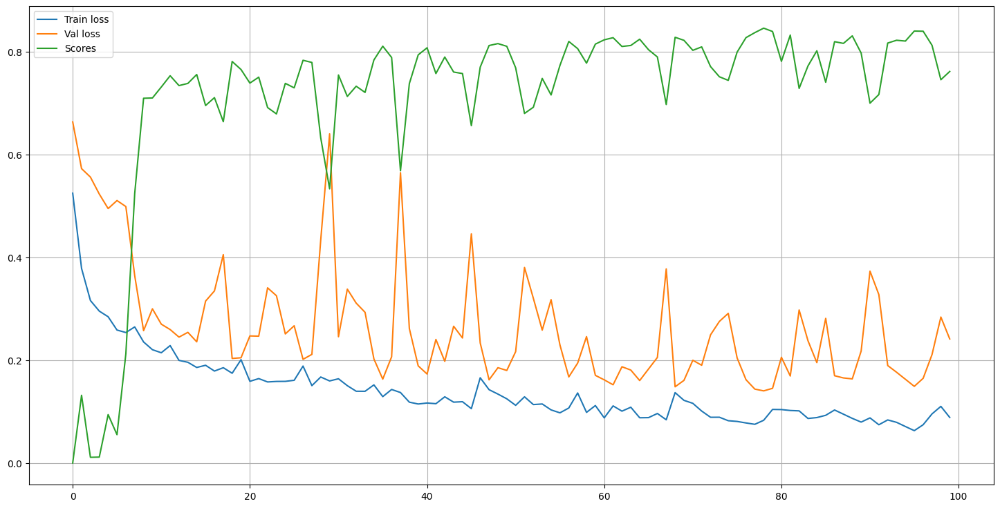

In [74]:
plt.figure(figsize=(18, 9))
plt.plot(np.arange(len(train_losses)), train_losses, label='Train loss')
plt.plot(np.arange(len(val_losses)), val_losses, label='Val loss')
plt.plot(np.arange(len(scores)), scores, label='Scores')
plt.legend()
plt.grid()
plt.show()

In [75]:
best_model = UNet().to(device)
best_model.load_state_dict(torch.load('best_model_default.pth'))

<All keys matched successfully>

  0%|          | 0/2 [00:00<?, ?it/s]

(0.16363021731376648, 0.8387823700904846)

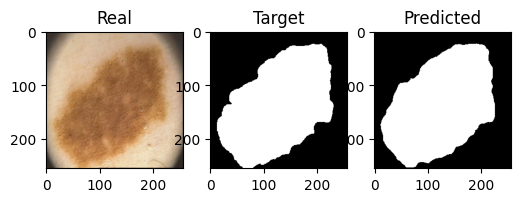

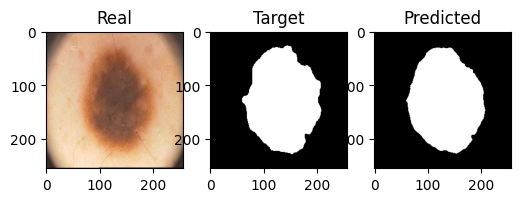

In [76]:
test(best_model, test_dataloader, criterion, iou_score)

In [85]:
unet_model2 = UNet().to(device)

In [86]:
optimizer2 = torch.optim.Adam(unet_model2.parameters(), lr=1e-3)
criterion2 = DiceLoss(mode='binary')
num_epoch = 100
dataloaders = {'train': train_dataloader, 'val': valid_dataloader}

In [84]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [87]:
train_losses2, val_losses2, scores2 = train(unet_model2, dataloaders, optimizer2, criterion2, iou_score, num_epoch, 'dice')

Epoch 1


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.4485287368297577


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.6293816864490509
Score 0.0
Epoch 2


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.33533748984336853


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.4551522731781006
Score 0.6318119168281555
Epoch 3


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.29653020203113556


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.48008230328559875
Score 0.3733493983745575
Epoch 4


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.2815449982881546


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.7025404572486877
Score 0.17782913148403168
Epoch 5


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.2640947550535202


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.3561747968196869
Score 0.5731249451637268
Epoch 6


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.23497246205806732


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.28358373045921326
Score 0.6612955331802368
Epoch 7


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.22993329167366028


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2850393056869507
Score 0.6583736538887024
Epoch 8


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.23502573370933533


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.37033969163894653
Score 0.48924800753593445
Epoch 9


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.21207167208194733


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2956829369068146
Score 0.5892390608787537
Epoch 10


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.19780126214027405


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.34661418199539185
Score 0.5103955864906311
Epoch 11


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1829349547624588


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.32811102271080017
Score 0.5342764258384705
Epoch 12


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1796501874923706


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2333166003227234
Score 0.6860388517379761
Epoch 13


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.18196122348308563


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.21470677852630615
Score 0.7086697220802307
Epoch 14


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.17173820734024048


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.2388313114643097
Score 0.679841935634613
Epoch 15


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1543925404548645


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1949804127216339
Score 0.7308722138404846
Epoch 16


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.14538025856018066


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.22519975900650024
Score 0.6805991530418396
Epoch 17


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1339273899793625


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.21928200125694275
Score 0.6892389059066772
Epoch 18


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13843177258968353


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.19458159804344177
Score 0.7198184728622437
Epoch 19


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.13186466693878174


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17082002758979797
Score 0.75725919008255
Epoch 20


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11958569288253784


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1609346568584442
Score 0.7628768682479858
Epoch 21


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11246441304683685


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1378835141658783
Score 0.7942593097686768
Epoch 22


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1171659380197525


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1492656171321869
Score 0.7771755456924438
Epoch 23


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.1201835423707962


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.23452669382095337
Score 0.6420466303825378
Epoch 24


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11950641870498657


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.15486285090446472
Score 0.7666515707969666
Epoch 25


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11564421653747559


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16869521141052246
Score 0.746386706829071
Epoch 26


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11481823027133942


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1460605263710022
Score 0.7774673104286194
Epoch 27


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11981470882892609


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.12738293409347534
Score 0.8036857843399048
Epoch 28


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10666295886039734


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.13469287753105164
Score 0.7869241833686829
Epoch 29


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12396563589572906


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16358759999275208
Score 0.7373979687690735
Epoch 30


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09281258285045624


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20515936613082886
Score 0.6736801862716675
Epoch 31


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08993595838546753


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1695559024810791
Score 0.7298750281333923
Epoch 32


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09729522466659546


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17129459977149963
Score 0.7252219915390015
Epoch 33


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.11418525874614716


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1534510850906372
Score 0.753498375415802
Epoch 34


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08575759828090668


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18693560361862183
Score 0.7019475102424622
Epoch 35


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.087982177734375


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.15521681308746338
Score 0.7492302656173706
Epoch 36


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08244624733924866


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10422319173812866
Score 0.8308125138282776
Epoch 37


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07981981337070465


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09882763028144836
Score 0.839756965637207
Epoch 38


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0783378928899765


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09334659576416016
Score 0.8480616211891174
Epoch 39


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0770362913608551


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10466575622558594
Score 0.8273847103118896
Epoch 40


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08536352217197418


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10841295123100281
Score 0.8175806999206543
Epoch 41


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07335463166236877


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10430371761322021
Score 0.8245300650596619
Epoch 42


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08646239340305328


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.13985666632652283
Score 0.7655819058418274
Epoch 43


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08991633355617523


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17008435726165771
Score 0.7189624905586243
Epoch 44


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.09336814284324646


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1632053554058075
Score 0.7319298982620239
Epoch 45


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.12890829145908356


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16341418027877808
Score 0.73015958070755
Epoch 46


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.10012196004390717


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17379966378211975
Score 0.7141944169998169
Epoch 47


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0868443101644516


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17940887808799744
Score 0.7071556448936462
Epoch 48


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0802437961101532


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20278221368789673
Score 0.6741853952407837
Epoch 49


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08868026733398438


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1584087312221527
Score 0.7369556427001953
Epoch 50


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0771910697221756


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16681259870529175
Score 0.7250399589538574
Epoch 51


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0935211032629013


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.18827149271965027
Score 0.6911643743515015
Epoch 52


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08448043465614319


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1878448724746704
Score 0.6926056742668152
Epoch 53


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0743885338306427


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.17158269882202148
Score 0.7182261943817139
Epoch 54


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07081305980682373


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10939162969589233
Score 0.8094272017478943
Epoch 55


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06853868067264557


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08966889977455139
Score 0.8458707928657532
Epoch 56


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06536814570426941


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08903065323829651
Score 0.8454873561859131
Epoch 57


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.08438506722450256


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10593447089195251
Score 0.8163353204727173
Epoch 58


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06931033730506897


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10547110438346863
Score 0.81549072265625
Epoch 59


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06389650702476501


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08634650707244873
Score 0.848912239074707
Epoch 60


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07239025831222534


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08182594180107117
Score 0.8572707772254944
Epoch 61


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05556343495845795


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08467122912406921
Score 0.8510213494300842
Epoch 62


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07177132368087769


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09671509265899658
Score 0.8292043805122375
Epoch 63


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07028242945671082


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09307307004928589
Score 0.8370959162712097
Epoch 64


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06554841995239258


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08680775761604309
Score 0.849348783493042
Epoch 65


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05949847400188446


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08915355801582336
Score 0.8423988223075867
Epoch 66


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07258644700050354


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10236558318138123
Score 0.8188307881355286
Epoch 67


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07283467054367065


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08903169631958008
Score 0.8438540697097778
Epoch 68


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05875992774963379


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10248333215713501
Score 0.8222218751907349
Epoch 69


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06025885045528412


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09569790959358215
Score 0.8336323499679565
Epoch 70


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0726633071899414


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10136038064956665
Score 0.8238029479980469
Epoch 71


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05818791687488556


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11191871762275696
Score 0.8024052977561951
Epoch 72


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.061393097043037415


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1023213267326355
Score 0.8173344731330872
Epoch 73


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05908133089542389


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09200742840766907
Score 0.8351243138313293
Epoch 74


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06977839767932892


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08986347913742065
Score 0.840297520160675
Epoch 75


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07674728333950043


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09141641855239868
Score 0.8369731903076172
Epoch 76


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05606444180011749


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10685589909553528
Score 0.8103362917900085
Epoch 77


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.053326040506362915


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11616390943527222
Score 0.7932990193367004
Epoch 78


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05412682890892029


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.12575116753578186
Score 0.7772932648658752
Epoch 79


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05825641751289368


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11460703611373901
Score 0.7962970733642578
Epoch 80


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.046787455677986145


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11852940917015076
Score 0.7913036346435547
Epoch 81


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.048486486077308655


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1172509491443634
Score 0.7930697798728943
Epoch 82


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06412386894226074


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.0746929943561554
Score 0.8645757436752319
Epoch 83


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05738005042076111


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.07845866680145264
Score 0.8597180843353271
Epoch 84


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05476105213165283


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08207723498344421
Score 0.85318523645401
Epoch 85


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05242718756198883


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08601656556129456
Score 0.8459599614143372
Epoch 86


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06625811755657196


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08637508749961853
Score 0.8456436395645142
Epoch 87


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05940772593021393


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.0967303216457367
Score 0.8272659778594971
Epoch 88


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05239570140838623


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10993251204490662
Score 0.8062583804130554
Epoch 89


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07044228911399841


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.11297500133514404
Score 0.8005599975585938
Epoch 90


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.06088186800479889


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08358195424079895
Score 0.8501761555671692
Epoch 91


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0545138418674469


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09131509065628052
Score 0.8359068036079407
Epoch 92


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05921216309070587


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08563777804374695
Score 0.844659686088562
Epoch 93


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.052358612418174744


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08408129215240479
Score 0.847392737865448
Epoch 94


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05623573064804077


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.0831143856048584
Score 0.8491907715797424
Epoch 95


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.05001957714557648


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1037682294845581
Score 0.8144353032112122
Epoch 96


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.051440611481666565


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08468559384346008
Score 0.8472026586532593
Epoch 97


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.04523076117038727


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.07515981793403625
Score 0.8626317977905273
Epoch 98


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.04592268168926239


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.07633727788925171
Score 0.8623455762863159
Epoch 99


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.060551077127456665


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08775463700294495
Score 0.8406457304954529
Epoch 100


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.04800152778625488


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10455870628356934
Score 0.8137733340263367


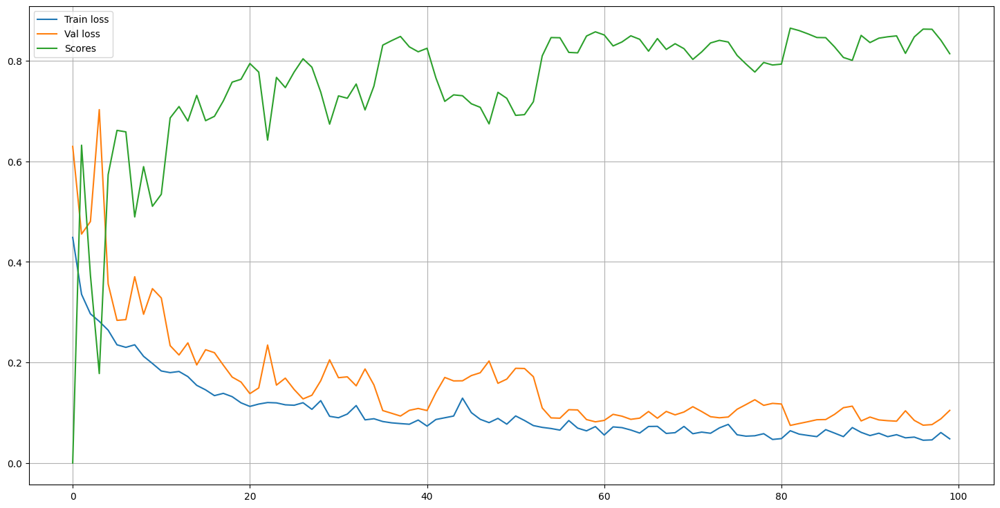

In [88]:
plt.figure(figsize=(18, 9))
plt.plot(np.arange(len(train_losses2)), train_losses2, label='Train loss')
plt.plot(np.arange(len(val_losses2)), val_losses2, label='Val loss')
plt.plot(np.arange(len(scores2)), scores2, label='Scores')
plt.legend()
plt.grid()
plt.show()

In [89]:
best_model2 = UNet().to(device)
best_model2.load_state_dict(torch.load('best_model_dice.pth'))

<All keys matched successfully>

  0%|          | 0/2 [00:00<?, ?it/s]

(0.08478274941444397, 0.8495919704437256)

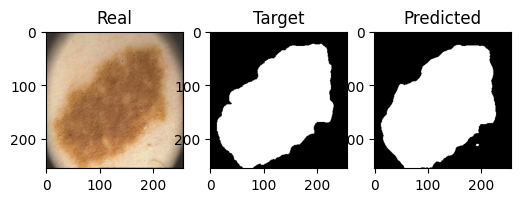

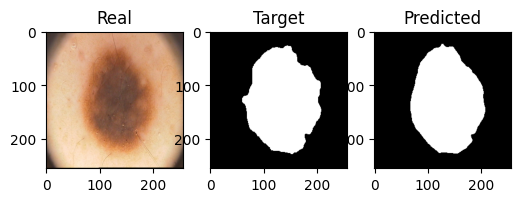

In [90]:
test(best_model2, test_dataloader, criterion2, iou_score)

In [91]:
unet_model3 = UNet().to(device)

In [92]:
optimizer3 = torch.optim.Adam(unet_model3.parameters(), lr=1e-3)
criterion3 = lambda x, y: sigmoid_focal_loss(
    x,
    y,
    reduction="mean"
)
num_epoch = 100
dataloaders = {'train': train_dataloader, 'val': valid_dataloader}

In [93]:
train_losses3, val_losses3, scores3 = train(unet_model3, dataloaders, optimizer3, criterion3, iou_score, num_epoch, 'sigmoid')

Epoch 1


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.07229285966604948


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09197932854294777
Score 0.0
Epoch 2


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.04082347545772791


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.07108011096715927
Score 0.0
Epoch 3


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.03260010993108153


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.055299170315265656
Score 0.0
Epoch 4


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.027916264720261097


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.05271292105317116
Score 0.0005874651833437383
Epoch 5


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.025911460630595684


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.050885314121842384
Score 0.012262270785868168
Epoch 6


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.022594868205487728


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.055904291570186615
Score 0.036713894456624985
Epoch 7


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.022814394906163216


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.05613402836024761
Score 0.20930953323841095
Epoch 8


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.021423898171633482


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.04181375168263912
Score 0.39203640818595886
Epoch 9


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.021100144367665052


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.04776662588119507
Score 0.46485763788223267
Epoch 10


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.020052481908351183


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.030169309116899967
Score 0.6493821740150452
Epoch 11


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.019748651888221502


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.08052099868655205
Score 0.5868193507194519
Epoch 12


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.019407495390623808


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.07738491520285606
Score 0.6125444173812866
Epoch 13


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01890772324986756


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.053804103285074234
Score 0.713116466999054
Epoch 14


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.021825104486197233


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.04357404261827469
Score 0.7057563066482544
Epoch 15


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01904203463345766


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.0797751359641552
Score 0.6456533670425415
Epoch 16


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.018161009764298797


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.030028551816940308
Score 0.7609617710113525
Epoch 17


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.019094369374215603


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.03901151195168495
Score 0.7411555647850037
Epoch 18


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.019085766281932592


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.05031590908765793
Score 0.7228603959083557
Epoch 19


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01897740690037608


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02998665999621153
Score 0.7730599641799927
Epoch 20


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0173951736651361


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.025585144758224487
Score 0.7954641580581665
Epoch 21


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.015793232014402747


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.030361071228981018
Score 0.7495154142379761
Epoch 22


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.016344383358955383


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02198974322527647
Score 0.7528206706047058
Epoch 23


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014874281594529748


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.049258289858698845
Score 0.7496241927146912
Epoch 24


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01665795547887683


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.0717715360224247
Score 0.7023290395736694
Epoch 25


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014447245514020324


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.038757335394620895
Score 0.7837023138999939
Epoch 26


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014860038412734866


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02538635954260826
Score 0.7945685982704163
Epoch 27


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.013806191738694906


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02875033486634493
Score 0.7774402499198914
Epoch 28


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014882890274748206


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02245667390525341
Score 0.8003820776939392
Epoch 29


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01809619227424264


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.03477661404758692
Score 0.7743144035339355
Epoch 30


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01520313136279583


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.03436962328851223
Score 0.779026985168457
Epoch 31


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01402820204384625


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02316611260175705
Score 0.7744376063346863
Epoch 32


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.013637367868795991


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.02764116320759058
Score 0.7893968224525452
Epoch 33


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.012735981494188309


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.028951686806976795
Score 0.7856622934341431
Epoch 34


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.015526993898674846


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01886090822517872
Score 0.8027359843254089
Epoch 35


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.013924638973549008


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.027736141346395016
Score 0.8069345951080322
Epoch 36


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.012467294000089169


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.026233961805701256
Score 0.8090704679489136
Epoch 37


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011837030993774533


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.022556808311492205
Score 0.8191108107566833
Epoch 38


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.010607689153403044


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.025717790238559246
Score 0.8191124200820923
Epoch 39


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01303482474759221


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.030840839259326458
Score 0.7898862361907959
Epoch 40


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011570701841264963


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.025739886797964573
Score 0.8072393536567688
Epoch 41


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011081937234848738


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.03880433179438114
Score 0.7604714035987854
Epoch 42


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.016071714693680406


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.023686225526034832
Score 0.7842652797698975
Epoch 43


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.013922189129516482


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.033431462943553925
Score 0.7636793255805969
Epoch 44


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011522542219609022


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.03045326191931963
Score 0.8035358190536499
Epoch 45


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.010815559886395931


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.027721294201910496
Score 0.8219287991523743
Epoch 46


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01289945445023477


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.043802449479699135
Score 0.7728210687637329
Epoch 47


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.009200351079925895


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.05280429683625698
Score 0.7374386191368103
Epoch 48


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.009579879464581609


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.018024423625320196
Score 0.8123385906219482
Epoch 49


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.009301902260631323


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01687169959768653
Score 0.8167707324028015
Epoch 50


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011624573497101665


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.018991229124367237
Score 0.8261812329292297
Epoch 51


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.013826799229718745


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.016997499391436577
Score 0.8198126554489136
Epoch 52


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.015416341833770275


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.1426357477903366
Score 0.5634465217590332
Epoch 53


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.014353660633787513


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.16465961560606956
Score 0.4761388301849365
Epoch 54


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01452700444497168


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.05614541843533516
Score 0.6595561504364014
Epoch 55


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.012344462797045708


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.022947811521589756
Score 0.8111767768859863
Epoch 56


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01246437756344676


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.04483451321721077
Score 0.7756034731864929
Epoch 57


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01058424822986126


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.032080995850265026
Score 0.7874398231506348
Epoch 58


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.010060858447104692


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.05274624563753605
Score 0.7093057632446289
Epoch 59


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011003682389855385


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.048005446791648865
Score 0.7350523471832275
Epoch 60


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.009405257413163781


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09132396802306175
Score 0.6405876874923706
Epoch 61


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.009175242856144905


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.127888485789299
Score 0.597156286239624
Epoch 62


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.0097854845225811


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.014007024466991425
Score 0.8284228444099426
Epoch 63


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011268081376329064


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.017152325715869665
Score 0.81754070520401
Epoch 64


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.009308588923886418


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.025784609839320183
Score 0.8228821754455566
Epoch 65


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.010976946912705898


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.46730008721351624
Score 0.4809859097003937
Epoch 66


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.012748476583510637


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.0393617432564497
Score 0.7905653119087219
Epoch 67


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.010796479415148497


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01638271100819111
Score 0.790894627571106
Epoch 68


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011207042494788766


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.017260864842683077
Score 0.8289126753807068
Epoch 69


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.010153829120099545


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.015478823333978653
Score 0.8462033271789551
Epoch 70


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.009531308198347688


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.026558252051472664
Score 0.811149537563324
Epoch 71


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011612931732088327


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.10481463745236397
Score 0.6652233600616455
Epoch 72


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.012130168732255697


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.021806242410093546
Score 0.8349486589431763
Epoch 73


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.012521567405201495


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.05833999998867512
Score 0.7083710432052612
Epoch 74


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.009908620733767748


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.20361881703138351
Score 0.5070247650146484
Epoch 75


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.00921513675712049


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.25749191641807556
Score 0.47025567293167114
Epoch 76


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.009988242760300636


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.09100255742669106
Score 0.654985785484314
Epoch 77


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011167587945237756


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.05250660516321659
Score 0.7303435206413269
Epoch 78


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.011261394014582038


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.017352087423205376
Score 0.8210645914077759
Epoch 79


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.008989735273644328


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.019093911163508892
Score 0.8432871699333191
Epoch 80


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.008945566951297224


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.022161277942359447
Score 0.8344463109970093
Epoch 81


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.007432227022945881


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.029412411153316498
Score 0.8129512667655945
Epoch 82


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01106645877007395


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.022046648897230625
Score 0.8204923272132874
Epoch 83


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.007401639479212463


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01552948821336031
Score 0.8496890068054199
Epoch 84


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.01046615350060165


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01679906016215682
Score 0.8390411734580994
Epoch 85


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.00848706322722137


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.030476818792521954
Score 0.8038986921310425
Epoch 86


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.007311514928005636


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.053666384890675545
Score 0.7836412191390991
Epoch 87


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.008158229757100344


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01791788637638092
Score 0.8485801815986633
Epoch 88


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.007229520590044558


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.013040781021118164
Score 0.8425400257110596
Epoch 89


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.008207329898141325


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.014424691442400217
Score 0.8362978100776672
Epoch 90


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.007568415603600442


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.019238612614572048
Score 0.8400339484214783
Epoch 91


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.00750933843664825


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.0378026170656085
Score 0.8033611178398132
Epoch 92


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.006906467257067561


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.018127086106687784
Score 0.8572134971618652
Epoch 93


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.008144099963828921


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.013401977717876434
Score 0.8495084047317505
Epoch 94


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.00704505096655339


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.013572930358350277
Score 0.8540448546409607
Epoch 95


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.00663971237372607


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01660554762929678
Score 0.84720778465271
Epoch 96


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.006955926772207022


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.017525848001241684
Score 0.8357210755348206
Epoch 97


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.006971118622459471


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.01856200024485588
Score 0.8400123119354248
Epoch 98


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.007825498702004552


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.026725318282842636
Score 0.8196840882301331
Epoch 99


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.007477556820958853


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.03604040015488863
Score 0.7923640608787537
Epoch 100


  0%|          | 0/4 [00:00<?, ?it/s]

Train loss 0.007001290214248002


  0%|          | 0/2 [00:00<?, ?it/s]

Val loss 0.017424616497009993
Score 0.8465298414230347


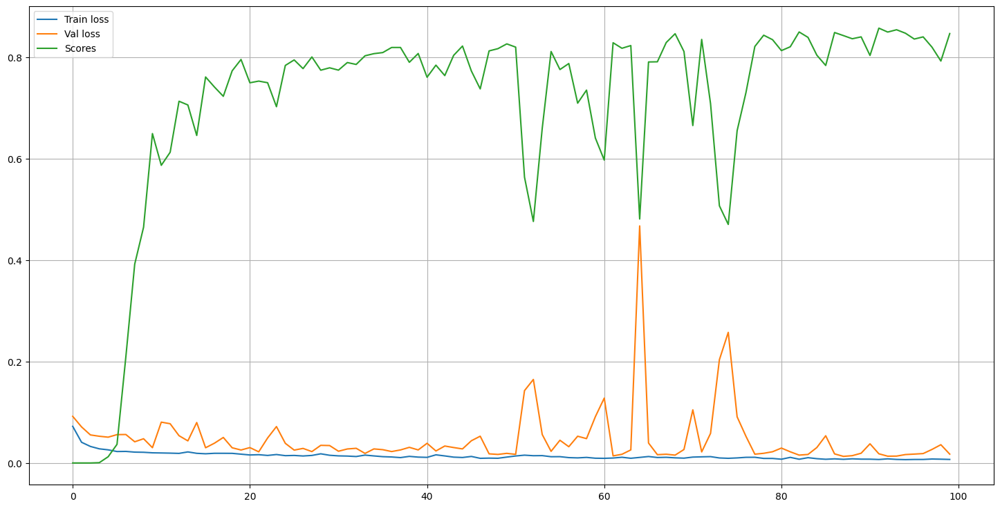

In [94]:
plt.figure(figsize=(18, 9))
plt.plot(np.arange(len(train_losses3)), train_losses3, label='Train loss')
plt.plot(np.arange(len(val_losses3)), val_losses3, label='Val loss')
plt.plot(np.arange(len(scores3)), scores3, label='Scores')
plt.legend()
plt.grid()
plt.show()

In [95]:
best_model3 = UNet().to(device)
best_model3.load_state_dict(torch.load('best_model_sigmoid.pth'))

<All keys matched successfully>

  0%|          | 0/2 [00:00<?, ?it/s]

(0.020808463916182518, 0.8512198328971863)

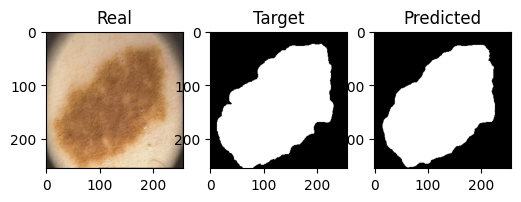

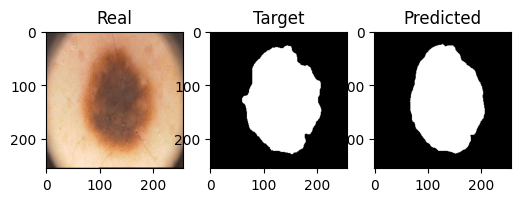

In [96]:
test(best_model3, test_dataloader, criterion3, iou_score)

## Обучите UNet

Задание: обучите UNet на всех трех лоссах: BCE, Dice, Focal и сравните результаты с SegNet:
*   Какая модель дает лучшие значения по метрике?
- По метрике (IoU) - лучшая модель UNet с Focal loss ~ 0.85
*   Какая модель дает лучшие значения по лоссам?
- По наименьшему loss - лучшая модель UNet с Focal loss ~ 0.02
*   Какая модель обучается быстрее?
- По времени быстрее обучается модель UNet, так как имеет более простую структуру. По сходимости можно выделить Focal loss - для двух моделей этот loss быстрее всего сходится.
*   Сравните визуально результаты SegNet и UNet.
- По визуальным результатам модель UNet точнее, так как маски более похожи на реальные и нет лишних шумов.
